# Time series forecasting - Medical Drug Forecast
Id - an Id that represents a (Store, Date) duple within the test set

Store - a unique Id for each store

Sales - the turnover for any given day (this is what you are predicting)

Customers - the number of customers on a given day

Open - an indicator for whether the store was open: 0 = closed, 1 = open

StateHoliday - indicates a state holiday. Normally all stores, with few exceptions, are closed on state holidays. Note that all schools are closed on public holidays and weekends. a = public holiday, b = Easter holiday, c = Christmas, 0 = None

SchoolHoliday - indicates if the (Store, Date) was affected by the closure of public schools

StoreType - differentiates between 4 different store models: a, b, c, d

Assortment - describes an assortment level: a = basic, b = extra, c = extended

CompetitionDistance - distance in meters to the nearest competitor store

CompetitionOpenSince[Month/Year] - gives the approximate year and month of the time the nearest competitor was opened

Promo - indicates whether a store is running a promo on that day

Promo2 - Promo2 is a continuing and consecutive promotion for some stores: 0 = store is not participating, 1 = store is participating

Promo2Since[Year/Week] - describes the year and calendar week when the store started participating in Promo2

PromoInterval-describes the consecutive intervals Promo2 is started, naming the months the promotion is started anew. E.g. "Feb,May,Aug,Nov" means each round starts in February, May, August, November of any given year for that store

# Initial setup

## Import required packages

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.preprocessing import StandardScaler

import datetime

import warnings
warnings.filterwarnings("ignore")

## Import time series data:  sales data for individual stores

In [2]:
## PLotting data and converting Date to index
data = pd.read_csv('train.csv')
data['Date'] = pd.to_datetime(data['Date'], format='%Y-%m-%d')
data = data.set_index('Date')
data = data[::-1]
data.head(12)

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
Date,,,,,,,,
2013-01-01,1115,2,0,0,0,0,a,1
2013-01-01,1114,2,0,0,0,0,a,1
2013-01-01,1113,2,0,0,0,0,a,1
2013-01-01,1112,2,0,0,0,0,a,1
2013-01-01,1111,2,0,0,0,0,a,1
2013-01-01,1110,2,0,0,0,0,a,1
2013-01-01,1109,2,0,0,0,0,a,1
2013-01-01,1108,2,0,0,0,0,a,1
2013-01-01,1107,2,0,0,0,0,a,1


In [3]:
data.shape

(1017209, 8)

In [4]:
## PLotting data 
store = pd.read_csv('store.csv')
store.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [5]:
store.shape

(1115, 10)

## Filtering Data, These stores are numbered - 1,3,8,9,13,25,29,31 and 46.
We will restrict our study to these stores only.

In [6]:
data_filter = data [(data['Store'] == 1) | (data['Store'] == 3) | (data['Store'] == 8) | (data['Store'] == 9) | 
                    (data['Store'] == 13) | (data['Store'] == 25) | (data['Store'] == 29) | (data['Store'] == 31) |
                   (data['Store'] == 46) | (data['Store'] == 39)]

In [7]:
data_filter.shape

(9052, 8)

In [8]:
print(data_filter.index.min())
print(data_filter.index.max())

2013-01-01 00:00:00
2015-07-31 00:00:00


- The dataset is from 1 January 2013 to 31 July 2015 , i.e. approx. 2.5 yrs.

In [9]:
li = ["DayOfWeek" , "StateHoliday" , "SchoolHoliday"]

for i in li:
  print(i)
  print(data_filter[i].unique())
  print("-----------------------")

DayOfWeek
[2 3 4 5 6 7 1]
-----------------------
StateHoliday
['a' '0' 'b' 'c' 0]
-----------------------
SchoolHoliday
[1 0]
-----------------------


- a = public holiday, b = Easter holiday, c = Christmas, 0 = None

In [10]:
data_filter.Store.nunique()

10

In [11]:
data_filter.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9052 entries, 2013-01-01 to 2015-07-31
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Store          9052 non-null   int64 
 1   DayOfWeek      9052 non-null   int64 
 2   Sales          9052 non-null   int64 
 3   Customers      9052 non-null   int64 
 4   Open           9052 non-null   int64 
 5   Promo          9052 non-null   int64 
 6   StateHoliday   9052 non-null   object
 7   SchoolHoliday  9052 non-null   int64 
dtypes: int64(7), object(1)
memory usage: 636.5+ KB


In [12]:
data_filter.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
count,9052.000000,9052.000000,9052.000000,9052.000000,9052.000000,9052.000000,9052.000000
mean,20.030049,3.998453,5250.303690,583.080977,0.824127,0.381352,0.177751
std,14.735797,1.997512,3395.304179,409.908973,0.380733,0.485746,0.382324
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8.000000,2.000000,3610.000000,421.000000,1.000000,0.000000,0.000000
50%,19.000000,4.000000,5269.000000,571.000000,1.000000,0.000000,0.000000
75%,31.000000,6.000000,7059.250000,718.000000,1.000000,1.000000,0.000000
max,46.000000,7.000000,24882.000000,2835.000000,1.000000,1.000000,1.000000


In [13]:
store[(store['Store'] == 1) |(store['Store'] == 3)|(store['Store'] == 8)|(store['Store'] == 9)|(store['Store'] == 13)|
      (store['Store'] == 25)     |(store['Store'] == 29)|(store['Store'] == 31)|(store['Store'] == 46)]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
7,8,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
8,9,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
12,13,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
24,25,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN
28,29,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN
30,31,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN
45,46,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"


**- Promo2 is present only in 3 stores, store 3,13,46. Rest stores are operating on the promo**

In [14]:
Store_grpby = data_filter.groupby(['Store']).sum()
Store_grpby['Promo2'] = 0

Store_grpby.loc[[3,13,46],'Promo2'] = 1
Store_grpby['avg_sale'] = Store_grpby['Sales']/Store_grpby['Open']
Store_grpby['avg_sale_percust'] = Store_grpby['Sales']/Store_grpby['Customers']

In [15]:
Store_grpby_grpby = Store_grpby.groupby(['Promo2']).sum()
Store_grpby_grpby['sale_avg_store'] = [Store_grpby_grpby['Sales'][0]/6 , Store_grpby_grpby['Sales'][1]/6]

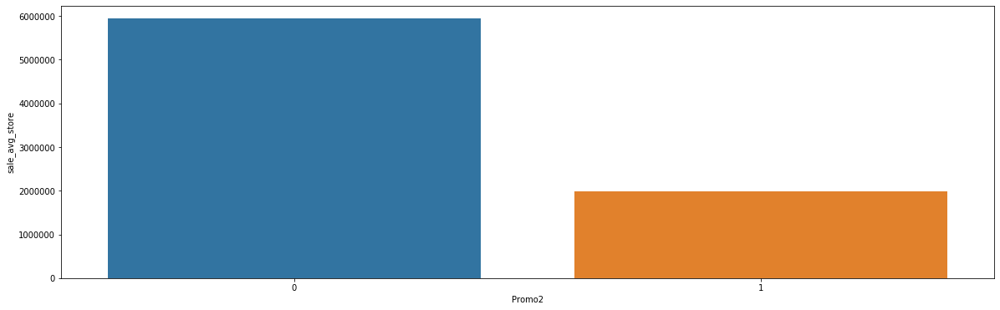

In [16]:
fig = plt.subplots(figsize=(20,6))
sns.barplot(x=Store_grpby_grpby.index, y=Store_grpby_grpby['sale_avg_store'], data=Store_grpby_grpby )

**- Average sale per store is more for the stores who have not opted for the Promo2 scheme**

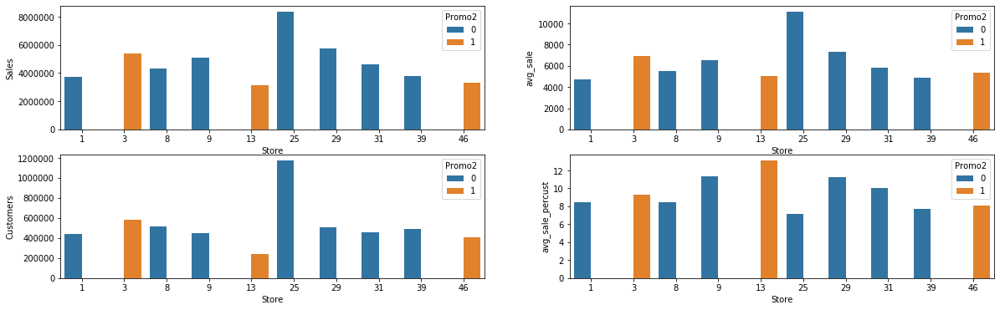

In [17]:
fig, axes = plt.subplots(2,2,figsize=(20,6))
sns.barplot(x=Store_grpby.index, y=Store_grpby['Sales'], data=Store_grpby ,ax = axes[0,0],hue = 'Promo2')
sns.barplot(x=Store_grpby.index, y=Store_grpby['Customers'], data=Store_grpby,ax = axes[1,0],hue = 'Promo2' )

sns.barplot(x=Store_grpby.index, y=Store_grpby['avg_sale'], data=Store_grpby ,ax = axes[0,1],hue = 'Promo2')
sns.barplot(x=Store_grpby.index, y=Store_grpby['avg_sale_percust'], data=Store_grpby,ax = axes[1,1],hue = 'Promo2' )

- **Store 25 has highest sales and customers**
- **average sale per day is highest for store 25**
- **average sales per customer is highest for store 13**

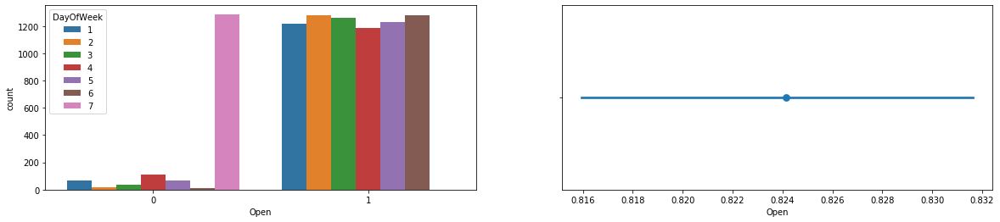

In [18]:
fig, (axis1,axis2) = plt.subplots(1,2,figsize=(20,4))
sns.countplot(x='Open',hue='DayOfWeek', data=data_filter, ax=axis1)
sns.pointplot(x='Open',hue='DayOfWeek', data=data_filter, ax=axis2)

- **The store is mainly closed on day 7 which is Sunday**

In [19]:
data_filter['year'] = pd. DatetimeIndex(data_filter.index). year

In [20]:
def plotter(StringA , StringB):
  fig, axes = plt.subplots(2,1)
  fig.set_size_inches(15, 10)
  sns.barplot(x=StringA, y=StringB, data=data_filter ,hue="DayOfWeek", ax = axes[0])
  sns.boxplot(x=StringA, y=StringB, data=data_filter ,hue="DayOfWeek", ax=axes[1])

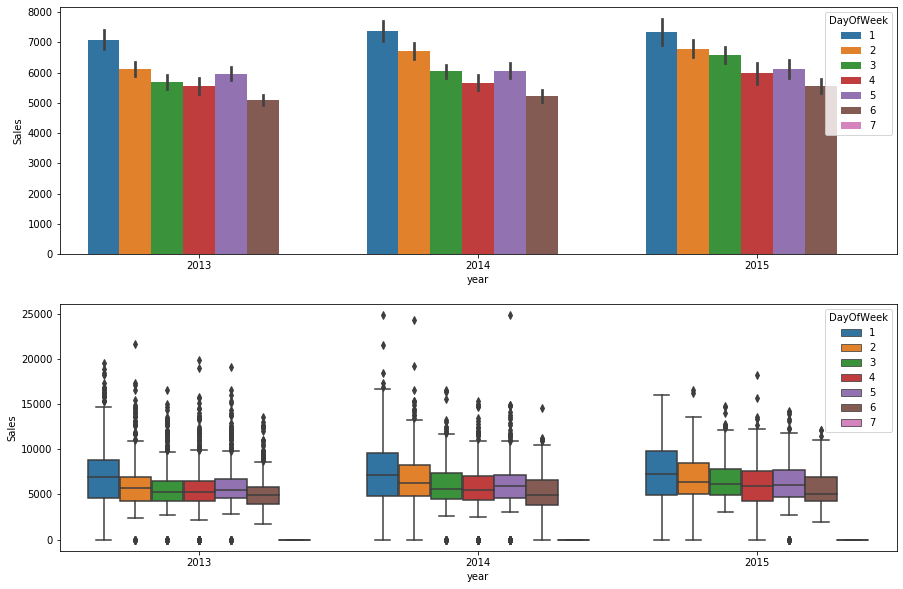

In [21]:
plotter("year" , "Sales")

- **Day 7 is Sunday no sale is reportted as shop is closed**
- **On Monday maximum sale is reported compared to other days**

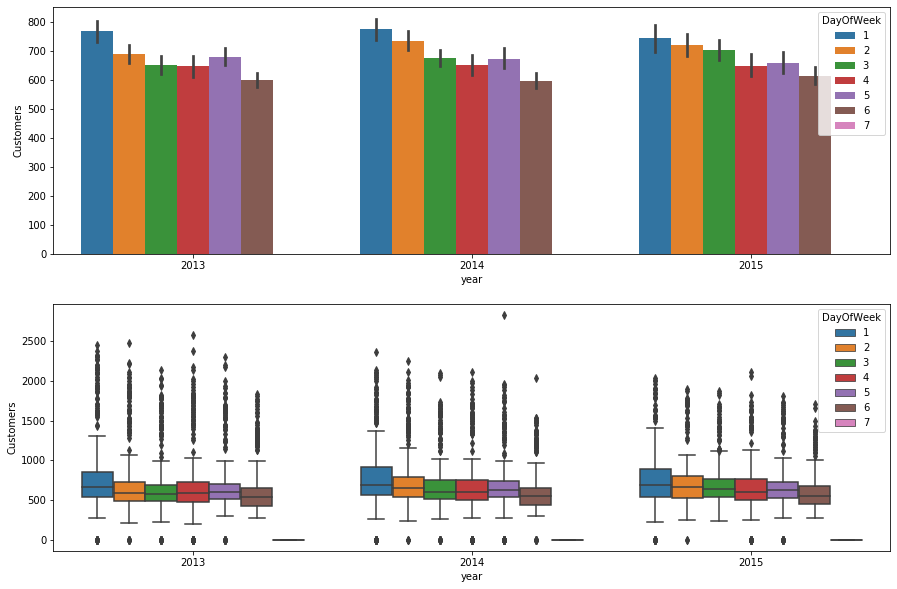

In [22]:
plotter("year" , "Customers")

- **Day 7 is Sunday no sale is reportted as shop is closed**

In [23]:
##Encoding SateHolidays
data_filter["StateHoliday"] = data_filter["StateHoliday"].map({0: 0, "0": 0, "a": 1, "b": 1, "c": 1})

In [24]:
data_filter.StateHoliday.value_counts()

0    8774
1     278
Name: StateHoliday, dtype: int64

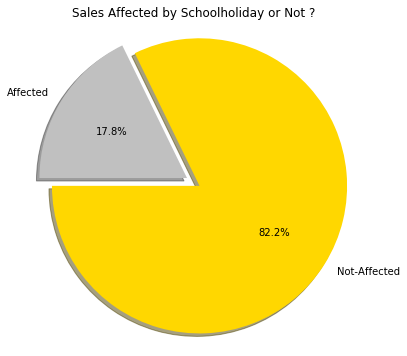

In [25]:
##Sales Affected by Schoolholiday or Not ?
labels = 'Not-Affected' , 'Affected'
sizes = data_filter.SchoolHoliday.value_counts()
colors = ['gold', 'silver']
explode = (0.1, 0.0)
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=180)
plt.axis('equal')
plt.title("Sales Affected by Schoolholiday or Not ?")
plt.plot()
fig=plt.gcf()
fig.set_size_inches(6,6)
plt.show()

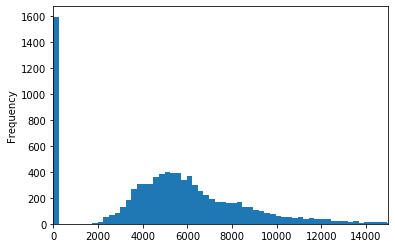

In [26]:
data_filter["Sales"].plot(kind='hist',bins=100,xlim=(0,15000))

In [27]:
data_filter.drop('year',axis=1, inplace = True)

# Time series analysis

## Plot time series data

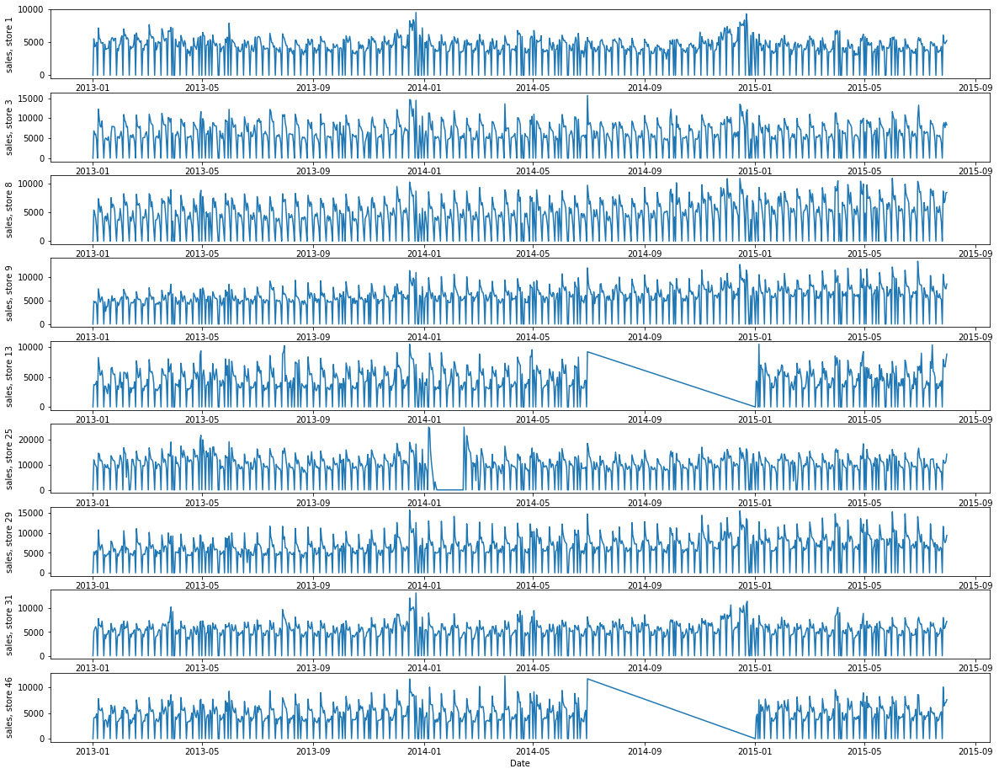

In [28]:
## Important stores are 1,3,8,9,13,25,29,31 and 46

fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9) = plt.subplots(9, 1,figsize=(20,16))
##fig.suptitle('A tale of 2 subplots')

ax1.plot( data[data['Store'] == 1]['Sales'])
ax1.set_ylabel('sales, store 1')

ax2.plot( data[data['Store'] == 3]['Sales'])
ax2.set_ylabel('sales, store 3')

ax3.plot( data[data['Store'] == 8]['Sales'])
ax3.set_ylabel('sales, store 8')

ax4.plot( data[data['Store'] == 9]['Sales'])
ax4.set_ylabel('sales, store 9')

ax5.plot( data[data['Store'] == 13]['Sales'])
ax5.set_ylabel('sales, store 13')

ax6.plot( data[data['Store'] == 25]['Sales'])
ax6.set_ylabel('sales, store 25')

ax7.plot( data[data['Store'] == 29]['Sales'])
ax7.set_ylabel('sales, store 29')

ax8.plot( data[data['Store'] == 31]['Sales'])
ax8.set_ylabel('sales, store 31')

ax9.plot( data[data['Store'] == 46]['Sales'])
ax9.set_xlabel('Date')
ax9.set_ylabel('sales, store 46')

plt.show()

### Seperating data for each stores, Important stores are 1,3,8,9,13,25,29,31 and 46


In [29]:
data1 = data_filter[data_filter['Store'] == 1]
data3 = data_filter[data_filter['Store'] == 3]
data8 = data_filter[data_filter['Store'] == 8]
data9 = data_filter[data_filter['Store'] == 9]
data13 = data_filter[data_filter['Store'] == 13]
data25 = data_filter[data_filter['Store'] == 25]
data29 = data_filter[data_filter['Store'] == 29]
data31 = data_filter[data_filter['Store'] == 31]
data46 = data_filter[data_filter['Store'] == 46]

## additional
data39 = data_filter[data_filter['Store'] == 39]

In [30]:
print(data1.shape)
print(data3.shape)
print(data8.shape)
print(data9.shape)
print(data13.shape)
print(data25.shape)
print(data29.shape)
print(data31.shape)
print(data46.shape)

print(data39.shape)

(942, 8)
(942, 8)
(942, 8)
(942, 8)
(758, 8)
(942, 8)
(942, 8)
(942, 8)
(758, 8)
(942, 8)


- 184 missing data points in record for shop 13 and 46 

## Missing value treatment

In [31]:
data_filter.isna().sum()

Store            0
DayOfWeek        0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

- No missing value present

Text(0, 0.5, 'sales, store 13')

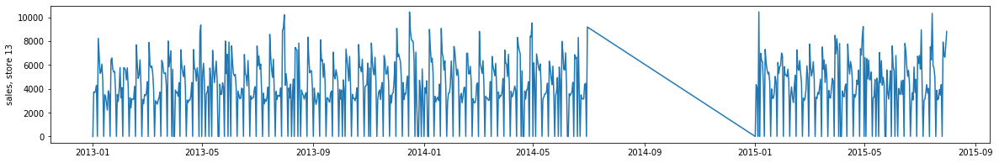

In [32]:
fig, (ax1) = plt.subplots(figsize=(20,3))
ax1.plot( data13['Sales'])
ax1.set_ylabel('sales, store 13')

In [33]:
#data13.loc['2014-06-28' : '2015-01-03']

#### For store 13
- Missing records between 2014-06-30 to 2015-01-01, 6 months data ('2014-07-01','2014-12-31')
- Need to treat these values

Text(0, 0.5, 'sales, store 46')

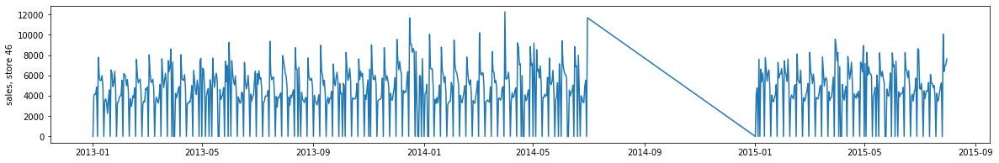

In [34]:
fig, (ax1) = plt.subplots(figsize=(20,3))
ax1.plot( data46['Sales'])
ax1.set_ylabel('sales, store 46')

In [35]:
#data46.loc['2014-06-28' : '2015-01-03']

#### For store 46
- Missing records between 2014-06-30 to 2015-01-01, 6 months data ('2014-07-01','2014-12-31')
- Need to treat these values

In [36]:
##treating 6 months data for store 13
## length should 942 in date index
idx = pd.date_range(min(data13.index), max(data13.index))
idx

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2015-07-22', '2015-07-23', '2015-07-24', '2015-07-25',
               '2015-07-26', '2015-07-27', '2015-07-28', '2015-07-29',
               '2015-07-30', '2015-07-31'],
              dtype='datetime64[ns]', length=942, freq='D')

In [37]:
data13 = data13.reindex(idx)
data46 = data46.reindex(idx)

In [38]:
data13.isna().sum()

Store            184
DayOfWeek        184
Sales            184
Customers        184
Open             184
Promo            184
StateHoliday     184
SchoolHoliday    184
dtype: int64

In [39]:
data13.shape

(942, 8)

In [40]:
## treating missing values in store attribute
data13['Store'].fillna(13, inplace=True)
data46['Store'].fillna(46, inplace=True)

In [41]:
data13.isna().sum()

Store              0
DayOfWeek        184
Sales            184
Customers        184
Open             184
Promo            184
StateHoliday     184
SchoolHoliday    184
dtype: int64

In [42]:
##imputing 'dayofweek' from store 1
#df2.loc[[2,3],:] = df1.loc[3].values
##the open status and stateholiday, Schoolholiday also copied from store 1, for store 13 and 46
data13.loc['2014-07-01' : '2014-12-31','DayOfWeek']= data1.loc['2014-07-01' : '2014-12-31','DayOfWeek']
data13.loc['2014-07-01' : '2014-12-31','Open'] = data1.loc['2014-07-01' : '2014-12-31','Open'] 
data13.loc['2014-07-01' : '2014-12-31','StateHoliday'] = data1.loc['2014-07-01' : '2014-12-31','StateHoliday']
data13.loc['2014-07-01' : '2014-12-31','SchoolHoliday'] = data1.loc['2014-07-01' : '2014-12-31','SchoolHoliday']

data46.loc['2014-07-01' : '2014-12-31','DayOfWeek']= data1.loc['2014-07-01' : '2014-12-31','DayOfWeek']
data46.loc['2014-07-01' : '2014-12-31','Open'] = data1.loc['2014-07-01' : '2014-12-31','Open'] 
data46.loc['2014-07-01' : '2014-12-31','StateHoliday'] = data1.loc['2014-07-01' : '2014-12-31','StateHoliday']
data46.loc['2014-07-01' : '2014-12-31','SchoolHoliday'] = data1.loc['2014-07-01' : '2014-12-31','SchoolHoliday']

In [43]:
data13.isna().sum()
data46.isna().sum()

Store              0
DayOfWeek          0
Sales            184
Customers        184
Open               0
Promo            184
StateHoliday       0
SchoolHoliday      0
dtype: int64

In [44]:
##lets check records for sunday
##When day of week is 7 there is no sales, no customer, open is zero,school holiday zero
data13[data13['DayOfWeek'] == 7].sum()

Store            1742.0
DayOfWeek         938.0
Sales               0.0
Customers           0.0
Open                0.0
Promo               0.0
StateHoliday        1.0
SchoolHoliday       7.0
dtype: float64

In [45]:
data13.loc[data13['DayOfWeek'] == 7, 'Sales'] = 0
data13.loc[data13['DayOfWeek'] == 7, 'Customers'] = 0

data46.loc[data46['DayOfWeek'] == 7, 'Sales'] = 0
data46.loc[data46['DayOfWeek'] == 7, 'Customers'] = 0

In [46]:
## Promo of store 39 and store 13 is matching so copying data in the missing segment
## Promo of store 3 and store 46 is matching so copying data in the missing segment
data13.loc['2014-07-01' : '2014-12-31','Promo']= data39.loc['2014-07-01' : '2014-12-31','Promo']

data46.loc['2014-07-01' : '2014-12-31','Promo']= data3.loc['2014-07-01' :'2014-12-31','Promo']

In [47]:
print(data13.isna().sum(), '\n')
print(data46.isna().sum())

Store              0
DayOfWeek          0
Sales            158
Customers        158
Open               0
Promo              0
StateHoliday       0
SchoolHoliday      0
dtype: int64 

Store              0
DayOfWeek          0
Sales            158
Customers        158
Open               0
Promo              0
StateHoliday       0
SchoolHoliday      0
dtype: int64


In [48]:
##imputing '2014-12-31':'2014-07-01' patch with last years '2014-1-1':'2013-07-02' one day adjustment is because of a day

##Customer
data46.loc['2014-07-01' : '2014-12-31','Customers']= data46.loc['2013-07-02' :'2014-1-1','Customers'].values

print(data46.loc['2014-07-01']['DayOfWeek'] == data46.loc['2013-07-02']['DayOfWeek'])
print(data46.loc['2014-12-31']['DayOfWeek'] == data46.loc['2014-1-1']['DayOfWeek'])

#data46.loc['2014-07-01' : '2014-12-31','Customers']

##Sales
data46.loc['2014-07-01' : '2014-12-31','Sales']= data46.loc['2013-07-02' : '2014-1-1','Sales'].values

#data46.loc['2014-07-01' : '2014-12-31','Sales']

True
True


In [49]:
##state holidays shops should be closed and no sell

data46.loc[data46['StateHoliday'] != 0, ['Sales','Customers']] = 0

#data46[data46['StateHoliday'] != 0]

In [50]:
data46.isna().sum()

Store            0
DayOfWeek        0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

In [51]:
##imputing '2014-12-31':'2014-07-01' patch with last years '2014-1-1':'2013-07-02' one day adjustment is because of a day

##Customer
data13.loc['2014-07-01' : '2014-12-31','Customers']= data13.loc['2013-07-02' : '2014-1-1','Customers'].values

print(data13.loc['2014-07-01']['DayOfWeek'] == data13.loc['2013-07-02']['DayOfWeek'])
print(data13.loc['2014-12-31']['DayOfWeek'] == data13.loc['2014-1-1']['DayOfWeek'])

##data13.loc['2014-07-01':'2014-12-31','Customers']

##Sales
data13.loc['2014-07-01' :'2014-12-31','Sales']= data13.loc['2013-07-02':'2014-1-1','Sales'].values

##data13.loc['2014-07-01':'2014-12-31','Sales']

True
True


In [52]:
##state holidays shops should be closed and no sell

data13.loc[data13['StateHoliday'] != 0, ['Sales','Customers']] = 0

#data13[data13['StateHoliday'] != 0]

In [53]:
data13.isna().sum()

Store            0
DayOfWeek        0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

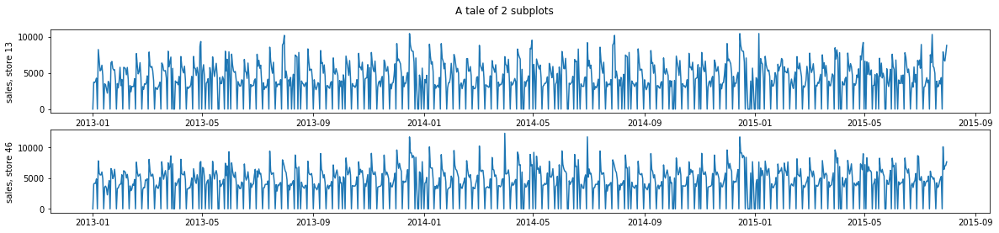

In [54]:
fig, (ax1, ax2) = plt.subplots(2, 1,figsize=(20,4))
fig.suptitle('A tale of 2 subplots')

ax1.plot( data13['Sales'])
ax1.set_ylabel('sales, store 13')

ax2.plot( data46['Sales'])
ax2.set_ylabel('sales, store 46')

plt.show();

## Outlier detection

### Box plot and interquartile range

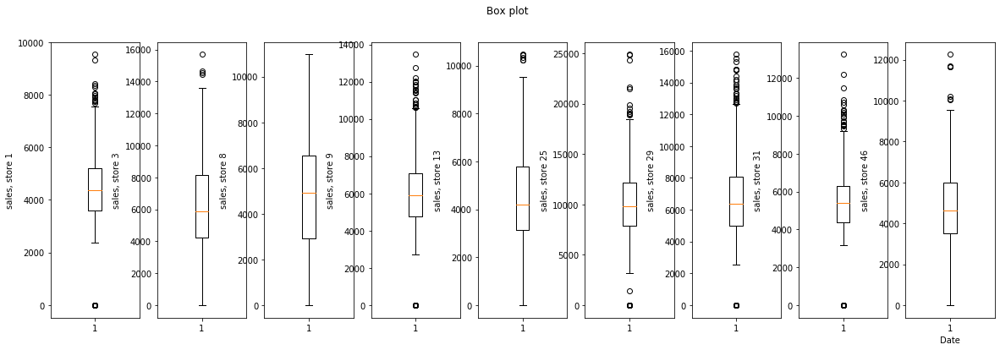

In [55]:
## Important stores are 1,3,8,9,13,25,29,31 and 46

fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9) = plt.subplots(1,9,figsize=(20,6))
fig.suptitle('Box plot')

ax1.boxplot( data1['Sales'])
ax1.set_ylabel('sales, store 1')

ax2.boxplot( data3['Sales'])
ax2.set_ylabel('sales, store 3')

ax3.boxplot( data8['Sales'])
ax3.set_ylabel('sales, store 8')

ax4.boxplot( data9['Sales'])
ax4.set_ylabel('sales, store 9')

ax5.boxplot( data13['Sales'])
ax5.set_ylabel('sales, store 13')

ax6.boxplot( data25['Sales'])
ax6.set_ylabel('sales, store 25')

ax7.boxplot( data29['Sales'])
ax7.set_ylabel('sales, store 29')

ax8.boxplot( data31['Sales'])
ax8.set_ylabel('sales, store 31')

ax9.boxplot( data46['Sales'])
ax9.set_xlabel('Date')
ax9.set_ylabel('sales, store 46')

plt.show()

In [56]:
print(data1.describe([0.0,0.25,0.50,0.75,0.99]))
print(data3.describe([0.0,0.25,0.50,0.75,0.99]))
print(data8.describe([0.0,0.25,0.50,0.75,0.99]))
print(data9.describe([0.0,0.25,0.50,0.75,0.99]))
print(data13.describe([0.0,0.25,0.50,0.75,0.99]))
print(data25.describe([0.0,0.25,0.50,0.75,0.99]))
print(data29.describe([0.0,0.25,0.50,0.75,0.99]))
print(data31.describe([0.0,0.25,0.50,0.75,0.99]))
print(data46.describe([0.0,0.25,0.50,0.75,0.99]))

       Store   DayOfWeek        Sales    Customers        Open       Promo  \
count  942.0  942.000000   942.000000   942.000000  942.000000  942.000000   
mean     1.0    3.997877  3945.704883   467.646497    0.829087    0.382166   
std      0.0    1.998404  2015.417840   228.930850    0.376633    0.486175   
min      1.0    1.000000     0.000000     0.000000    0.000000    0.000000   
0%       1.0    1.000000     0.000000     0.000000    0.000000    0.000000   
25%      1.0    2.000000  3588.250000   463.000000    1.000000    0.000000   
50%      1.0    4.000000  4373.500000   529.000000    1.000000    0.000000   
75%      1.0    6.000000  5220.000000   598.750000    1.000000    1.000000   
99%      1.0    7.000000  7806.240000   846.310000    1.000000    1.000000   
max      1.0    7.000000  9528.000000  1130.000000    1.000000    1.000000   

       StateHoliday  SchoolHoliday  
count    942.000000     942.000000  
mean       0.028662       0.204883  
std        0.166945       0.40

       Store   DayOfWeek         Sales    Customers        Open       Promo  \
count  942.0  942.000000    942.000000   942.000000  942.000000  942.000000   
mean    46.0    3.997877   4387.504246   542.075372    0.824841    0.382166   
std      0.0    1.998404   2516.846140   277.523674    0.380305    0.486175   
min     46.0    1.000000      0.000000     0.000000    0.000000    0.000000   
0%      46.0    1.000000      0.000000     0.000000    0.000000    0.000000   
25%     46.0    2.000000   3525.250000   512.000000    1.000000    0.000000   
50%     46.0    4.000000   4615.500000   619.000000    1.000000    0.000000   
75%     46.0    6.000000   5982.000000   711.750000    1.000000    1.000000   
99%     46.0    7.000000   9512.150000   989.180000    1.000000    1.000000   
max     46.0    7.000000  12250.000000  1092.000000    1.000000    1.000000   

       StateHoliday  SchoolHoliday  
count    942.000000     942.000000  
mean       0.033970       0.196391  
std        0.181249

In [57]:
##Cliping at 99 percentile, for outlier treatment, with respect to sales
data1.Sales.clip(lower=data1.Sales.quantile(0.00), upper=data1.Sales.quantile(0.99),inplace=True)
data3.Sales.clip(lower=data3.Sales.quantile(0.00), upper=data3.Sales.quantile(0.99),inplace=True)
data8.Sales.clip(lower=data8.Sales.quantile(0.00), upper=data8.Sales.quantile(0.99),inplace=True)
data9.Sales.clip(lower=data9.Sales.quantile(0.00), upper=data9.Sales.quantile(0.99),inplace=True)
data13.Sales.clip(lower=data13.Sales.quantile(0.00), upper=data13.Sales.quantile(0.99),inplace=True)
data25.Sales.clip(lower=data25.Sales.quantile(0.00), upper=data25.Sales.quantile(0.99),inplace=True)
data29.Sales.clip(lower=data29.Sales.quantile(0.00), upper=data29.Sales.quantile(0.99),inplace=True)
data31.Sales.clip(lower=data31.Sales.quantile(0.00), upper=data31.Sales.quantile(0.99),inplace=True)
data46.Sales.clip(lower=data46.Sales.quantile(0.00), upper=data46.Sales.quantile(0.99),inplace=True)

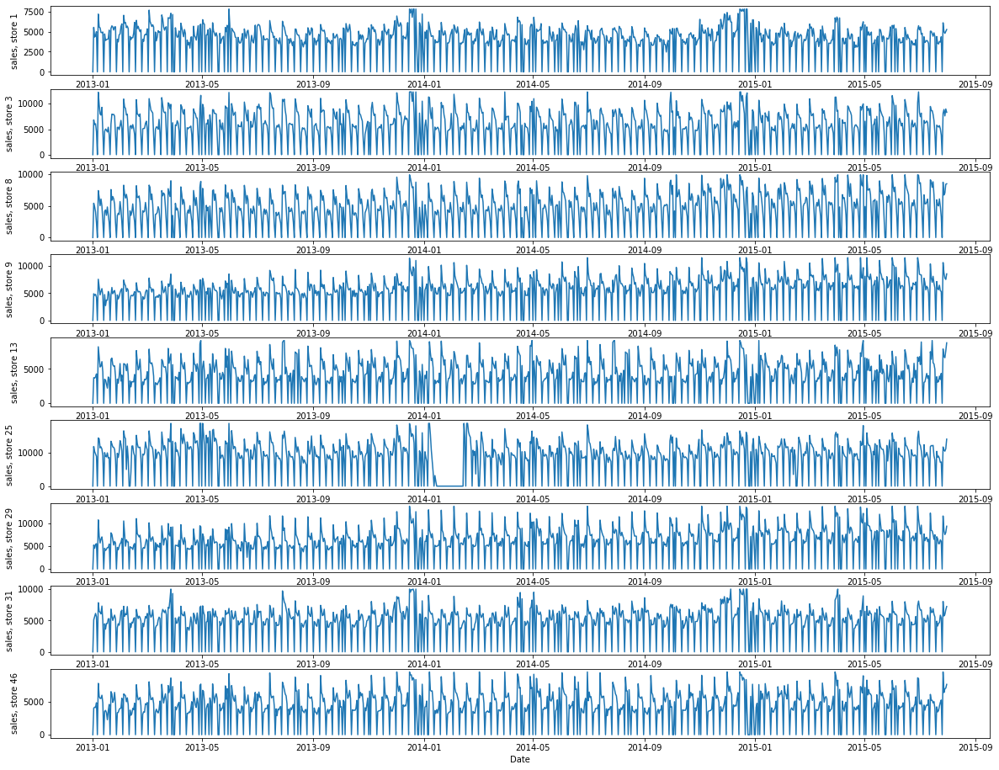

In [58]:
## Important stores are 1,3,8,9,13,25,29,31 and 46

fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9) = plt.subplots(9, 1,figsize=(20,16))
##fig.suptitle('A tale of 2 subplots')

ax1.plot( data1.Sales)
ax1.set_ylabel('sales, store 1')

ax2.plot(data3.Sales)
ax2.set_ylabel('sales, store 3')

ax3.plot(data8.Sales)
ax3.set_ylabel('sales, store 8')

ax4.plot(data9.Sales)
ax4.set_ylabel('sales, store 9')

ax5.plot(data13.Sales)
ax5.set_ylabel('sales, store 13')

ax6.plot(data25.Sales)
ax6.set_ylabel('sales, store 25')

ax7.plot(data29.Sales)
ax7.set_ylabel('sales, store 29')

ax8.plot(data31.Sales)
ax8.set_ylabel('sales, store 31')

ax9.plot(data46.Sales)
ax9.set_xlabel('Date')
ax9.set_ylabel('sales, store 46')

plt.show()

## Time series Decomposition

### Additive seasonal decomposition

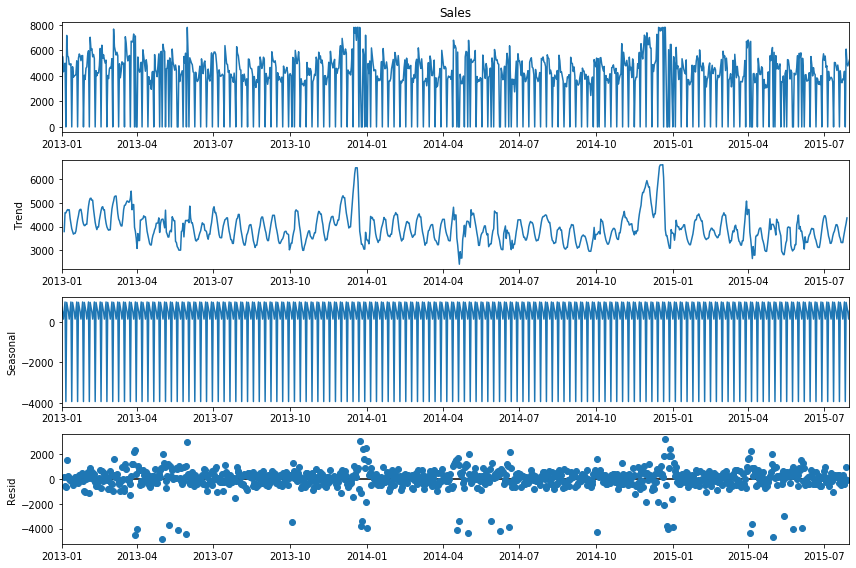

In [59]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data1.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

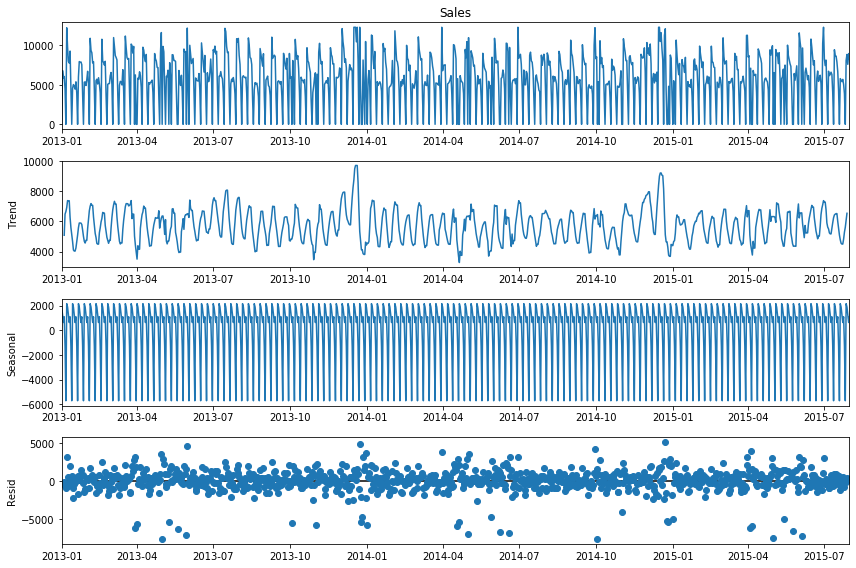

In [60]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data3.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

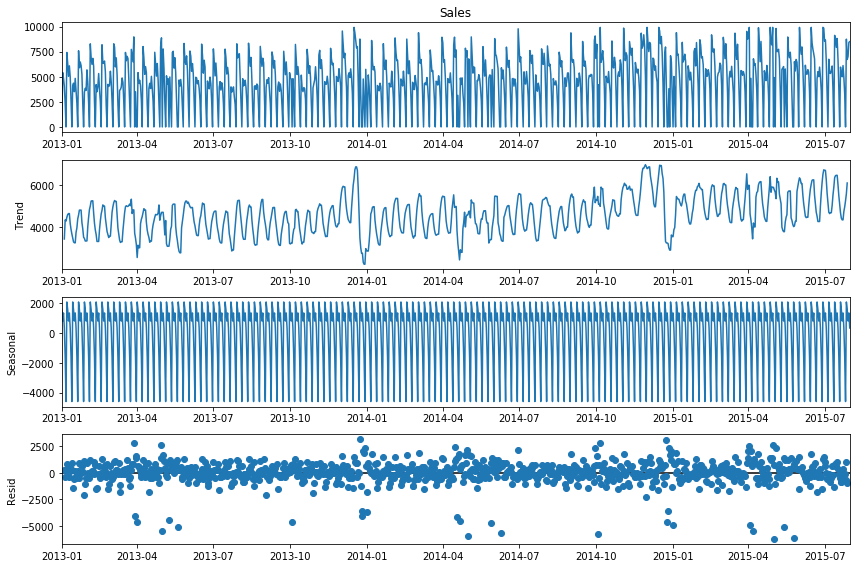

In [61]:
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data8.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

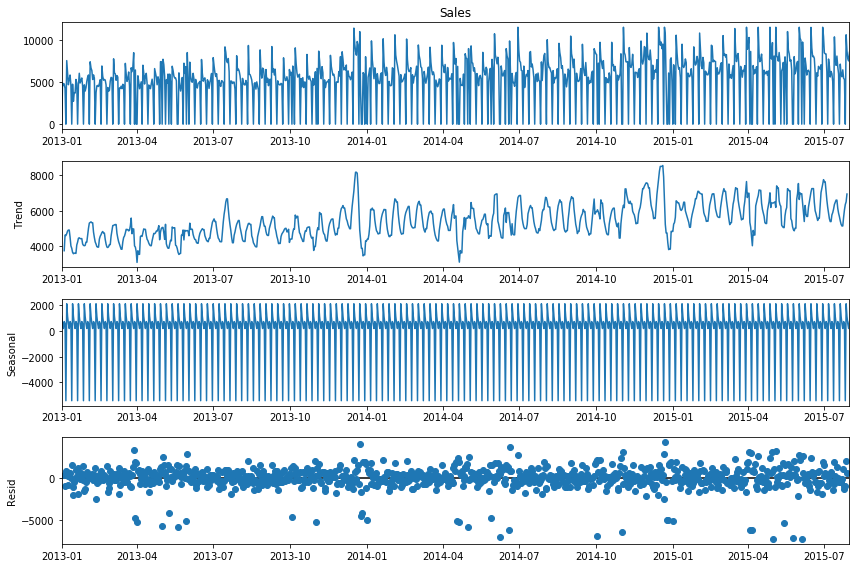

In [62]:
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data9.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

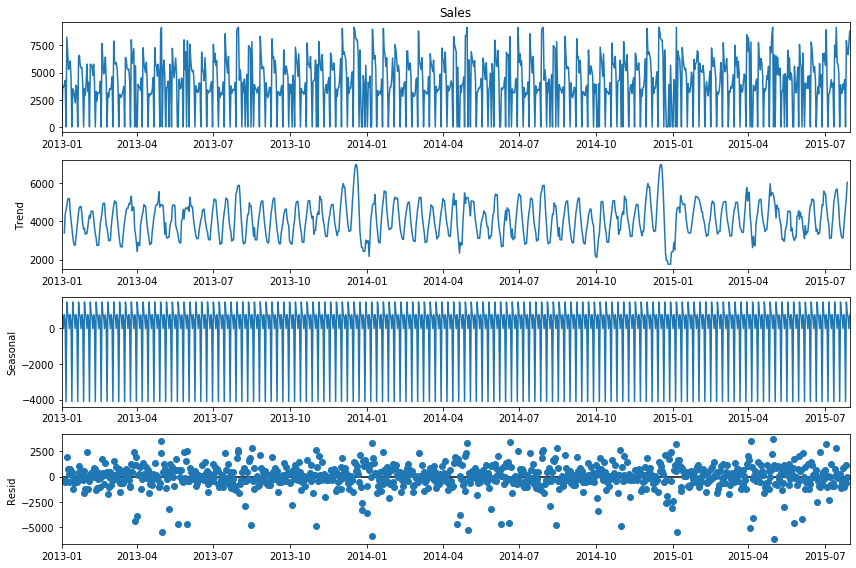

In [63]:
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data13.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

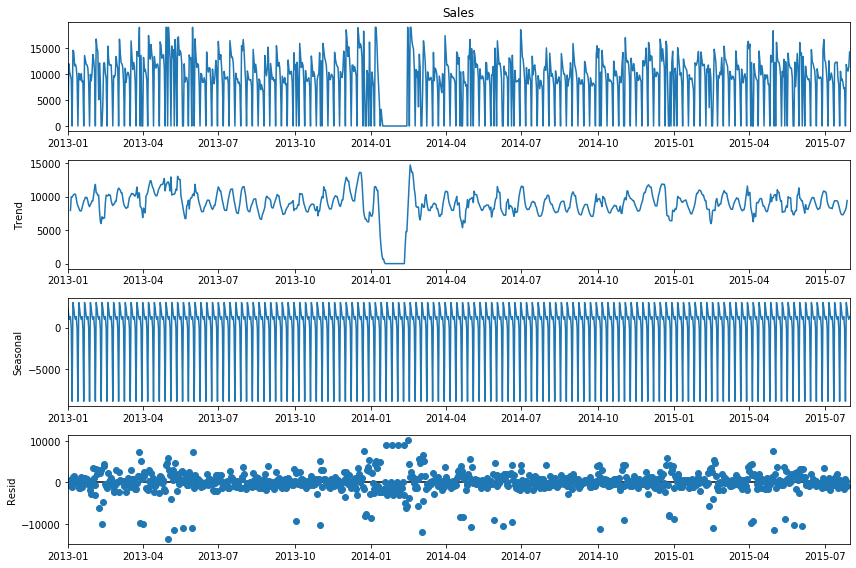

In [64]:
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data25.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

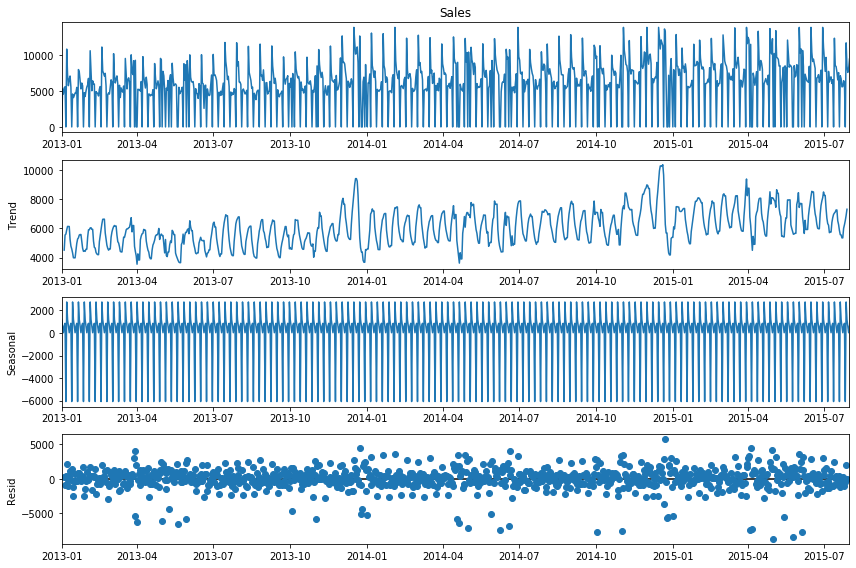

In [65]:
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data29.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

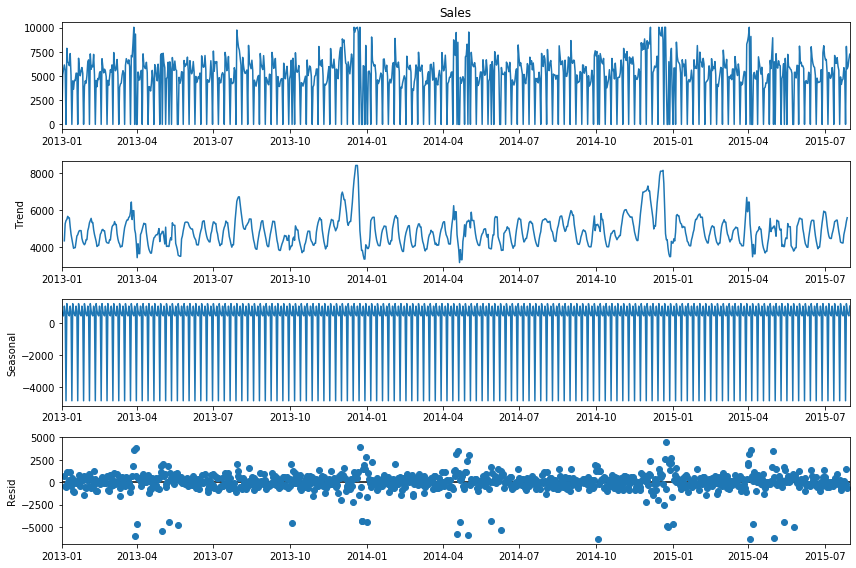

In [66]:
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data31.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

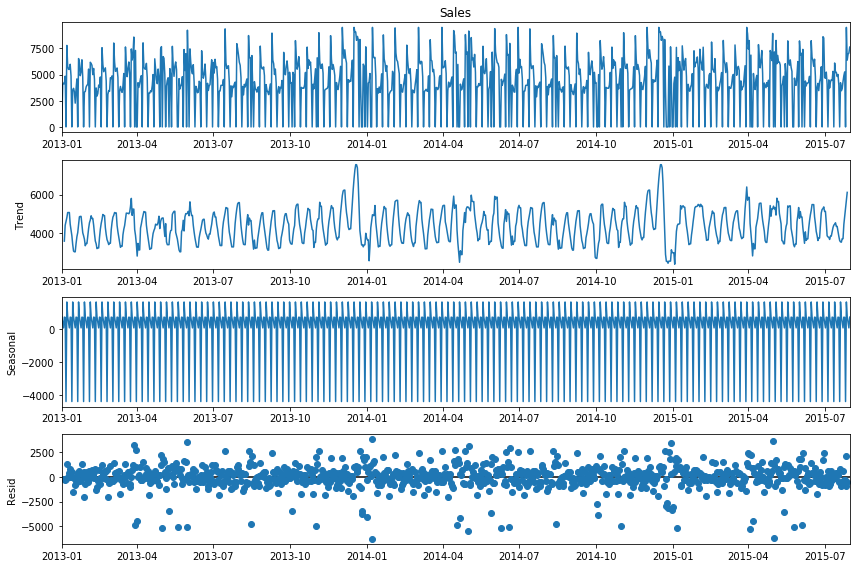

In [67]:
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(data46.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

- **Shows a strong day wise seasonality**

# Build and evaluate time series forecast

## Split time series data into training and test set

In [68]:
##Diving between train and test, last 6 mont is for test
train_len = 761

train1, test1  = data1[:train_len], data1[train_len:] 
train3, test3  = data3[:train_len], data3[train_len:] 
train8, test8  = data8[:train_len], data8[train_len:] 
train9, test9  = data9[:train_len], data9[train_len:] 
train13, test13  = data13[:train_len], data13[train_len:] 
train25, test25  = data25[:train_len], data25[train_len:] 
train29, test29  = data29[:train_len], data29[train_len:] 
train31, test31  = data31[:train_len], data31[train_len:] 
train46, test46  = data46[:train_len], data46[train_len:]

In [69]:
train3[['Sales','Customers']]

,Sales,Customers
Date,,
2013-01-01,0.0,0
2013-01-02,6823.0,805
2013-01-03,5902.0,721
2013-01-04,6069.0,690
2013-01-05,4523.0,525
...,...,...
2015-01-27,8292.0,893
2015-01-28,6883.0,722
2015-01-29,7485.0,738


In [70]:
##Standardising data, train data
#scaler1 = scaler3 = scaler8=scaler9=scaler13=scaler25=scaler29=scaler31=scaler46=

scaler1 = StandardScaler().fit(train1[['Sales','Customers']])
train1[['Sales','Customers']] = scaler1.transform(train1[['Sales','Customers']])
test1[['Sales','Customers']] = scaler1.transform(test1[['Sales','Customers']])
data1_trans = data1.copy()
data1_trans[['Sales','Customers']] = scaler1.transform(data1[['Sales','Customers']])

scaler3 = StandardScaler().fit(train3[['Sales','Customers']])
train3[['Sales','Customers']] = scaler3.transform(train3[['Sales','Customers']])
test3[['Sales','Customers']] = scaler3.transform(test3[['Sales','Customers']])
data3_trans = data3.copy()
data3_trans[['Sales','Customers']] = scaler3.transform(data3[['Sales','Customers']])

scaler8 = StandardScaler().fit(train8[['Sales','Customers']])
train8[['Sales','Customers']] = scaler8.transform(train8[['Sales','Customers']])
test8[['Sales','Customers']] = scaler8.transform(test8[['Sales','Customers']])
data8_trans = data8.copy()
data8_trans[['Sales','Customers']] = scaler8.transform(data8[['Sales','Customers']])

scaler9 = StandardScaler().fit(train9[['Sales','Customers']])
train9[['Sales','Customers']] = scaler9.transform(train9[['Sales','Customers']])
test9[['Sales','Customers']] = scaler9.transform(test9[['Sales','Customers']])
data9_trans = data9.copy()
data9_trans[['Sales','Customers']] = scaler9.transform(data9[['Sales','Customers']])

scaler13 = StandardScaler().fit(train13[['Sales','Customers']])
train13[['Sales','Customers']] = scaler13.transform(train13[['Sales','Customers']])
test13[['Sales','Customers']] = scaler13.transform(test13[['Sales','Customers']])
data13_trans = data13.copy()
data13_trans[['Sales','Customers']] = scaler13.transform(data13[['Sales','Customers']])

scaler25 = StandardScaler().fit(train25[['Sales','Customers']])
train25[['Sales','Customers']] = scaler25.transform(train25[['Sales','Customers']])
test25[['Sales','Customers']] = scaler25.transform(test25[['Sales','Customers']])
data25_trans = data25.copy()
data25_trans[['Sales','Customers']] = scaler25.transform(data25[['Sales','Customers']])

scaler29 = StandardScaler().fit(train29[['Sales','Customers']])
train29[['Sales','Customers']] = scaler29.transform(train29[['Sales','Customers']])
test29[['Sales','Customers']] = scaler29.transform(test29[['Sales','Customers']])
data29_trans = data29.copy()
data29_trans[['Sales','Customers']] = scaler29.transform(data29[['Sales','Customers']])

scaler31 = StandardScaler().fit(train31[['Sales','Customers']])
train31[['Sales','Customers']] = scaler31.transform(train31[['Sales','Customers']])
test31[['Sales','Customers']] = scaler31.transform(test31[['Sales','Customers']])
data31_trans = data31.copy()
data31_trans[['Sales','Customers']] = scaler31.transform(data31[['Sales','Customers']])

scaler46 = StandardScaler().fit(train46[['Sales','Customers']])
train46[['Sales','Customers']] = scaler46.transform(train46[['Sales','Customers']])
test46[['Sales','Customers']] = scaler46.transform(test46[['Sales','Customers']])
data46_trans = data46.copy()
data46_trans[['Sales','Customers']] = scaler46.transform(data46[['Sales','Customers']])

In [71]:
##Creating a df called data1_model
train1_univar = train1.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)
test1_univar = test1.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)

train3_univar = train3.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)
test3_univar = test3.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)

train8_univar = train8.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)
test8_univar = test8.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)

train9_univar = train9.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)
test9_univar = test9.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)

train13_univar = train13.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)
test13_univar = test13.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)

train25_univar = train25.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)
test25_univar = test25.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)

train29_univar = train29.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)
test29_univar = test29.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)

train31_univar = train31.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)
test31_univar = test31.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)

train46_univar = train46.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)
test46_univar = test46.drop(['Store','DayOfWeek','Customers','Open','Promo','SchoolHoliday','StateHoliday'], axis=1)

In [72]:
##naming for ref
train1_univar.name = 'train1_univar'
train3_univar.name = 'train3_univar'
train8_univar.name = 'train8_univar'
train9_univar.name = 'train9_univar'
train13_univar.name = 'train13_univar'
train25_univar.name = 'train25_univar'
train29_univar.name = 'train29_univar'
train31_univar.name = 'train31_univar'
train46_univar.name = 'train46_univar'

In [73]:
dflist = [train1_univar,train3_univar, train8_univar, train9_univar, train13_univar, train25_univar, train29_univar,
         train31_univar, train46_univar]

In [74]:
from statsmodels.tsa.stattools import adfuller

for n in dflist:
    adf_test = adfuller(n['Sales'])
    print(n.name)
    print('ADF Statistic: %f' % adf_test[0])
    print('Critical Values @ 0.05: %.2f' % adf_test[4]['5%'])
    print('p-value: %f' % adf_test[1])
    
    if adf_test[1] <= 0.05:
        print(f" => P-Value = {adf_test[1]}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {adf_test[1]}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")    
    print('\n')

train1_univar
ADF Statistic: -3.658384
Critical Values @ 0.05: -2.87
p-value: 0.004738
 => P-Value = 0.004738088984843739. Rejecting Null Hypothesis.
 => Series is Stationary.


train3_univar
ADF Statistic: -4.989511
Critical Values @ 0.05: -2.87
p-value: 0.000023
 => P-Value = 2.3278772124562858e-05. Rejecting Null Hypothesis.
 => Series is Stationary.


train8_univar
ADF Statistic: -3.820210
Critical Values @ 0.05: -2.87
p-value: 0.002707
 => P-Value = 0.002707179691291794. Rejecting Null Hypothesis.
 => Series is Stationary.


train9_univar
ADF Statistic: -3.213018
Critical Values @ 0.05: -2.87
p-value: 0.019243
 => P-Value = 0.0192433859396947. Rejecting Null Hypothesis.
 => Series is Stationary.


train13_univar
ADF Statistic: -6.833406
Critical Values @ 0.05: -2.87
p-value: 0.000000
 => P-Value = 1.8686781778904454e-09. Rejecting Null Hypothesis.
 => Series is Stationary.


train25_univar
ADF Statistic: -3.451684
Critical Values @ 0.05: -2.87
p-value: 0.009318
 => P-Value = 0.009

In [75]:
from statsmodels.tsa.stattools import kpss
for n in dflist:
    kpss_test = kpss(n['Sales'])
    print(n.name)
    print('KPSS Statistic: %f' % kpss_test[0])
    print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
    print('p-value: %f' % kpss_test[1])
    
    if kpss_test[1] > 0.05:
        print(f" => P-Value = {kpss_test[1]}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {kpss_test[1]}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")    
    print('\n')

train1_univar
KPSS Statistic: 0.196777
Critical Values @ 0.05: 0.46
p-value: 0.100000
 => P-Value = 0.1. Rejecting Null Hypothesis.
 => Series is Stationary.


train3_univar
KPSS Statistic: 0.065466
Critical Values @ 0.05: 0.46
p-value: 0.100000
 => P-Value = 0.1. Rejecting Null Hypothesis.
 => Series is Stationary.


train8_univar
KPSS Statistic: 1.344808
Critical Values @ 0.05: 0.46
p-value: 0.010000
 => P-Value = 0.01. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


train9_univar
KPSS Statistic: 2.650837
Critical Values @ 0.05: 0.46
p-value: 0.010000
 => P-Value = 0.01. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


train13_univar
KPSS Statistic: 0.102142
Critical Values @ 0.05: 0.46
p-value: 0.100000
 => P-Value = 0.1. Rejecting Null Hypothesis.
 => Series is Stationary.


train25_univar
KPSS Statistic: 0.251265
Critical Values @ 0.05: 0.46
p-value: 0.100000
 => P-Value = 0.1. Rejecting Null Hypothesis.
 => Series is Statio

### All 9 series sales data is stationary

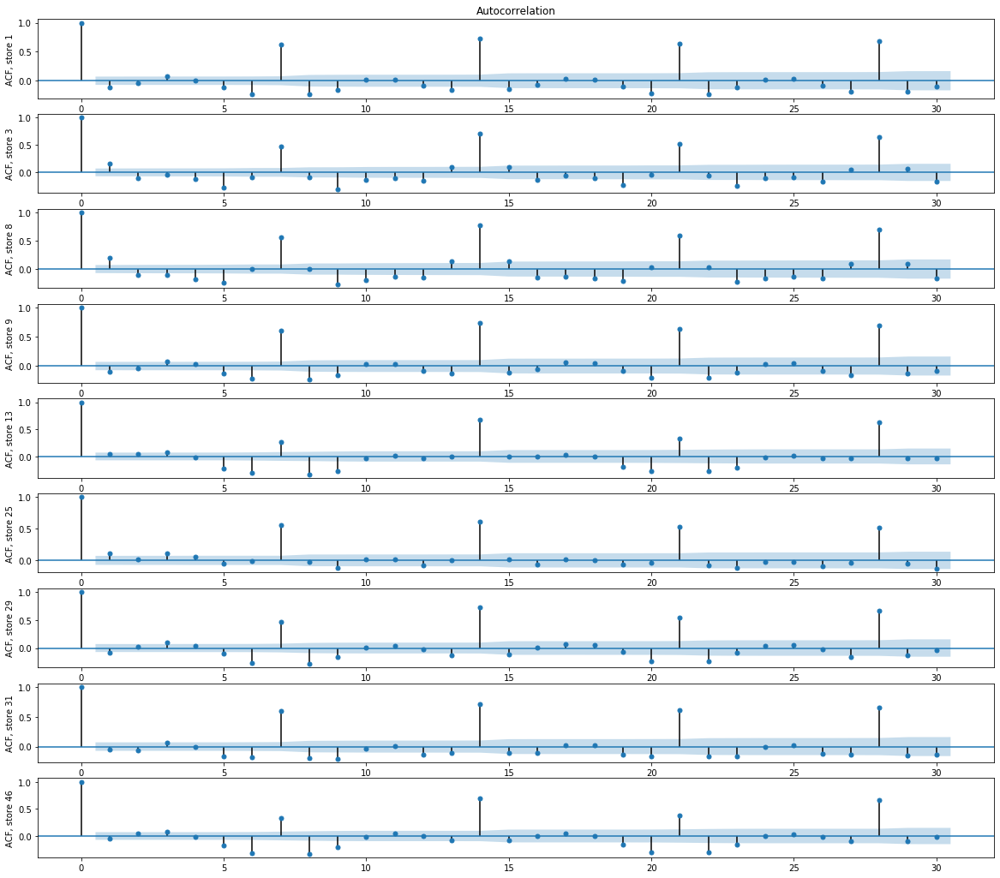

In [76]:
##ACF function
from statsmodels.graphics.tsaplots import plot_acf

fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9) = plt.subplots(9, 1,figsize=(20,18))
#fig.suptitle('ACF plots')

plot_acf(train1_univar['Sales'], ax=ax1, lags = 30)
ax1.set_ylabel('ACF, store 1')

plot_acf(train3_univar['Sales'], ax=ax2, lags = 30, title = '')
ax2.set_ylabel('ACF, store 3')

plot_acf(train8_univar['Sales'], ax=ax3, lags = 30, title = '')
ax3.set_ylabel('ACF, store 8')

plot_acf(train9_univar['Sales'], ax=ax4, lags = 30, title = '')
ax4.set_ylabel('ACF, store 9')

plot_acf(train13_univar['Sales'], ax=ax5, lags = 30, title = '')
ax5.set_ylabel('ACF, store 13')

plot_acf(train25_univar['Sales'], ax=ax6, lags = 30, title = '')
ax6.set_ylabel('ACF, store 25')

plot_acf(train29_univar['Sales'], ax=ax7, lags = 30, title = '')
ax7.set_ylabel('ACF, store 29')

plot_acf(train31_univar['Sales'], ax=ax8, lags = 30, title = '')
ax8.set_ylabel('ACF, store 31')

plot_acf(train46_univar['Sales'], ax=ax9, lags = 30, title = '')
ax9.set_ylabel('ACF, store 46')

plt.show()

- ***ACF plot shows strong correlation with 7 lag, representing weekly seasonality***

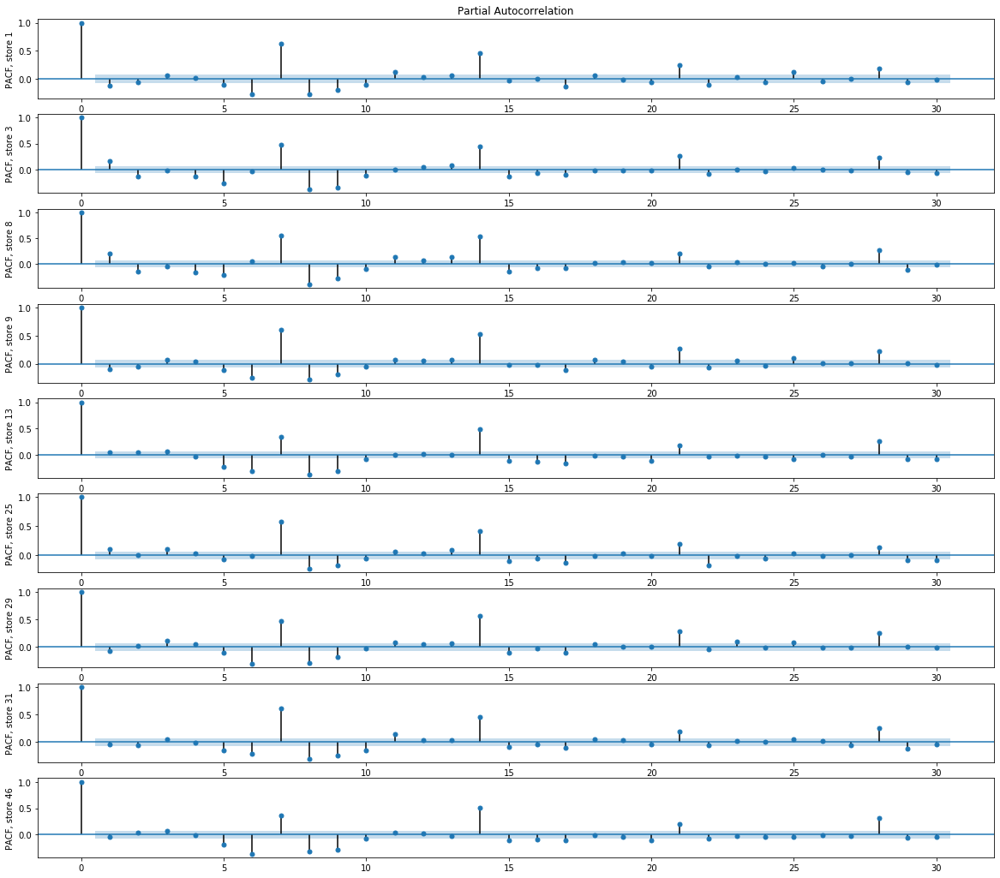

In [77]:
##PACF function
from statsmodels.graphics.tsaplots import plot_pacf

fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9) = plt.subplots(9, 1,figsize=(20,18))
#fig.suptitle('ACF plots')

plot_pacf(train1_univar['Sales'], ax=ax1, lags = 30)
ax1.set_ylabel('PACF, store 1')

plot_pacf(train3_univar['Sales'], ax=ax2, lags = 30, title = '')
ax2.set_ylabel('PACF, store 3')

plot_pacf(train8_univar['Sales'], ax=ax3, lags = 30, title = '')
ax3.set_ylabel('PACF, store 8')

plot_pacf(train9_univar['Sales'], ax=ax4, lags = 30, title = '')
ax4.set_ylabel('PACF, store 9')

plot_pacf(train13_univar['Sales'], ax=ax5, lags = 30, title = '')
ax5.set_ylabel('PACF, store 13')

plot_pacf(train25_univar['Sales'], ax=ax6, lags = 30, title = '')
ax6.set_ylabel('PACF, store 25')

plot_pacf(train29_univar['Sales'], ax=ax7, lags = 30, title = '')
ax7.set_ylabel('PACF, store 29')

plot_pacf(train31_univar['Sales'], ax=ax8, lags = 30, title = '')
ax8.set_ylabel('PACF, store 31')

plot_pacf(train46_univar['Sales'], ax=ax9, lags = 30, title = '')
ax9.set_ylabel('PACF, store 46')

plt.show()

- ***PACF plot shows strong correlation with 7 lag, representing weekly seasonality***

In [78]:
from statsmodels.tsa.arima_model import ARIMA

model1 = ARIMA(train1_univar['Sales'], order=(7, 0, 0)) 
model_fit1 = model1.fit()
print('store 1')
print( model_fit1.params)
print('\n')

model3 = ARIMA(train3_univar['Sales'], order=(7, 0, 0)) 
model_fit3 = model3.fit()
print('store 3')
print( model_fit3.params)
print('\n')

model8 = ARIMA(train8_univar['Sales'], order=(7, 0, 0)) 
model_fit8 = model8.fit()
print('store 8')
print( model_fit8.params)
print('\n')

model9 = ARIMA(train9_univar['Sales'], order=(7, 0, 0)) 
model_fit9 = model9.fit()
print('store 9')
print( model_fit9.params)
print('\n')

model13 = ARIMA(train13_univar['Sales'], order=(7, 0, 0)) 
model_fit13 = model13.fit()
print('store 13')
print( model_fit13.params)
print('\n')

model25 = ARIMA(train25_univar['Sales'], order=(7, 0, 0)) 
model_fit25 = model25.fit()
print('store 25')
print( model_fit25.params)
print('\n')

model29 = ARIMA(train29_univar['Sales'], order=(7, 0, 0)) 
model_fit29 = model29.fit()
print('store 29')
print( model_fit29.params)
print('\n')

model31 = ARIMA(train31_univar['Sales'], order=(7, 0, 0)) 
model_fit31 = model31.fit()
print('store 31')
print( model_fit31.params)
print('\n')

model46 = ARIMA(train46_univar['Sales'], order=(7, 0, 0)) 
model_fit46 = model46.fit()
print('store 46')
print( model_fit46.params)

store 1
const         -0.000433
ar.L1.Sales    0.012191
ar.L2.Sales    0.049326
ar.L3.Sales    0.076358
ar.L4.Sales   -0.052078
ar.L5.Sales   -0.113669
ar.L6.Sales   -0.177617
ar.L7.Sales    0.624816
dtype: float64


store 3
const         -0.000918
ar.L1.Sales    0.145696
ar.L2.Sales   -0.021438
ar.L3.Sales    0.011244
ar.L4.Sales   -0.073491
ar.L5.Sales   -0.185119
ar.L6.Sales   -0.102793
ar.L7.Sales    0.473444
dtype: float64


store 8
const         -0.000602
ar.L1.Sales    0.164328
ar.L2.Sales   -0.042011
ar.L3.Sales    0.012535
ar.L4.Sales   -0.086432
ar.L5.Sales   -0.129434
ar.L6.Sales   -0.059864
ar.L7.Sales    0.550182
dtype: float64


store 9
const         -0.000979
ar.L1.Sales    0.024473
ar.L2.Sales    0.061700
ar.L3.Sales    0.077446
ar.L4.Sales   -0.029701
ar.L5.Sales   -0.121803
ar.L6.Sales   -0.174187
ar.L7.Sales    0.598546
dtype: float64


store 13
const         -0.000562
ar.L1.Sales    0.069456
ar.L2.Sales    0.127978
ar.L3.Sales    0.105316
ar.L4.Sales   -0.040421
ar.

In [79]:
idx = pd.date_range('2013-01-01', '2015-09-11')
idx

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2015-09-02', '2015-09-03', '2015-09-04', '2015-09-05',
               '2015-09-06', '2015-09-07', '2015-09-08', '2015-09-09',
               '2015-09-10', '2015-09-11'],
              dtype='datetime64[ns]', length=984, freq='D')

In [80]:
data_trans_list = [data1_trans, data3_trans, data8_trans, data9_trans, data13_trans, data25_trans, data29_trans, data31_trans,
                  data46_trans]

In [81]:
##creating y_hat dataframes
y_hat1 = data1_trans.copy()
y_hat1 = y_hat1.reindex(idx)

y_hat3 = data3_trans.copy()
y_hat3 = y_hat3.reindex(idx)

y_hat8 = data8_trans.copy()
y_hat8 = y_hat8.reindex(idx)

y_hat9 = data9_trans.copy()
y_hat9 = y_hat9.reindex(idx)

y_hat13 = data13_trans.copy()
y_hat13 = y_hat13.reindex(idx)

y_hat25 = data25_trans.copy()
y_hat25 = y_hat25.reindex(idx)

y_hat29 = data29_trans.copy()
y_hat29 = y_hat29.reindex(idx)

y_hat31 = data31_trans.copy()
y_hat31 = y_hat31.reindex(idx)

y_hat46 = data46_trans.copy()
y_hat46 = y_hat46.reindex(idx)

In [82]:
y_hat46.isnull().sum()

Store            42
DayOfWeek        42
Sales            42
Customers        42
Open             42
Promo            42
StateHoliday     42
SchoolHoliday    42
dtype: int64

- **All y_hat, These 42 values are for the next 6 months prediction**
- **Sales and customers are the attributes which needs to be prediction, rest variables can be imputed from last year**
- **So that these can be used in SARIMAX and multivariate models**

In [83]:
## treating missing values in store attribute
y_hat1['Store'].fillna(1, inplace=True)
y_hat3['Store'].fillna(3, inplace=True)
y_hat8['Store'].fillna(8, inplace=True)
y_hat9['Store'].fillna(9, inplace=True)
y_hat13['Store'].fillna(13, inplace=True)
y_hat25['Store'].fillna(25, inplace=True)
y_hat29['Store'].fillna(29, inplace=True)
y_hat31['Store'].fillna(31, inplace=True)
y_hat46['Store'].fillna(46, inplace=True)

In [84]:
##All other attributes copying from last year data
##DayOfWeek,Open,,Promo, StateHoliday, StateHoliday, SchoolHoliday
list_cols = ['DayOfWeek','Open','Promo','StateHoliday','SchoolHoliday']

y_hat1.loc['2015-08-1' : '2015-09-11',list_cols]= y_hat1.loc['2014-08-2' : '2014-09-12',list_cols].values
y_hat3.loc['2015-08-1' : '2015-09-11',list_cols]= y_hat3.loc['2014-08-2' : '2014-09-12',list_cols].values
y_hat8.loc['2015-08-1' : '2015-09-11',list_cols]= y_hat8.loc['2014-08-2' : '2014-09-12',list_cols].values
y_hat9.loc['2015-08-1' : '2015-09-11',list_cols]= y_hat9.loc['2014-08-2' : '2014-09-12',list_cols].values
y_hat13.loc['2015-08-1' : '2015-09-11',list_cols]= y_hat13.loc['2014-08-2' : '2014-09-12',list_cols].values
y_hat25.loc['2015-08-1' : '2015-09-11',list_cols]= y_hat25.loc['2014-08-2' : '2014-09-12',list_cols].values
y_hat29.loc['2015-08-1' : '2015-09-11',list_cols]= y_hat29.loc['2014-08-2' : '2014-09-12',list_cols].values
y_hat31.loc['2015-08-1' : '2015-09-11',list_cols]= y_hat31.loc['2014-08-2' : '2014-09-12',list_cols].values
y_hat46.loc['2015-08-1' : '2015-09-11',list_cols]= y_hat46.loc['2014-08-2' : '2014-09-12',list_cols].values


In [85]:
y_hat1[['Sales','Customers']] = np.nan
y_hat3[['Sales','Customers']] = np.nan
y_hat8[['Sales','Customers']] = np.nan
y_hat9[['Sales','Customers']] = np.nan
y_hat13[['Sales','Customers']] = np.nan
y_hat25[['Sales','Customers']] = np.nan
y_hat29[['Sales','Customers']] = np.nan
y_hat31[['Sales','Customers']] = np.nan
y_hat46[['Sales','Customers']] = np.nan

In [86]:
print(y_hat1.isna().sum())
print('\n')
print(y_hat3.isna().sum())
print('\n')
print(y_hat8.isna().sum())
print('\n')
print(y_hat9.isna().sum())
print('\n')
print(y_hat13.isna().sum())
print('\n')
print(y_hat25.isna().sum())
print('\n')
print(y_hat29.isna().sum())
print('\n')
print(y_hat31.isna().sum())
print('\n')
print(y_hat46.isna().sum())

Store              0
DayOfWeek          0
Sales            984
Customers        984
Open               0
Promo              0
StateHoliday       0
SchoolHoliday      0
dtype: int64


Store              0
DayOfWeek          0
Sales            984
Customers        984
Open               0
Promo              0
StateHoliday       0
SchoolHoliday      0
dtype: int64


Store              0
DayOfWeek          0
Sales            984
Customers        984
Open               0
Promo              0
StateHoliday       0
SchoolHoliday      0
dtype: int64


Store              0
DayOfWeek          0
Sales            984
Customers        984
Open               0
Promo              0
StateHoliday       0
SchoolHoliday      0
dtype: int64


Store              0
DayOfWeek          0
Sales            984
Customers        984
Open               0
Promo              0
StateHoliday       0
SchoolHoliday      0
dtype: int64


Store              0
DayOfWeek          0
Sales            984
Customers        984
O

In [87]:
##predicting values for all the 9 stores
y_hat1['ar_forecast'] = model_fit1.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat3['ar_forecast'] = model_fit3.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat8['ar_forecast'] = model_fit8.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat9['ar_forecast'] = model_fit9.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat13['ar_forecast'] = model_fit13.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat25['ar_forecast'] = model_fit25.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat29['ar_forecast'] = model_fit29.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat31['ar_forecast'] = model_fit31.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat46['ar_forecast'] = model_fit46.predict(y_hat1.index.min(), y_hat1.index.max())

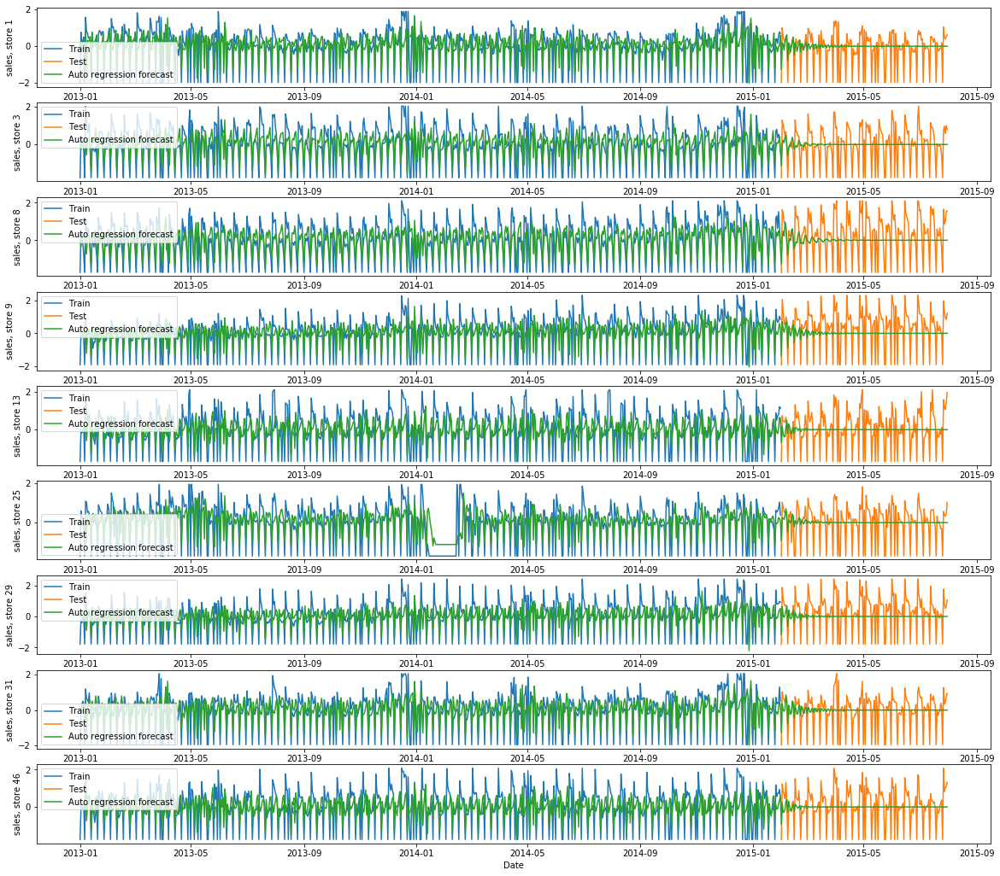

In [88]:
##Plotting predictions
## Important stores are 1,3,8,9,13,25,29,31 and 46

fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9) = plt.subplots(9, 1,figsize=(20,18))

ax1.plot(train1_univar['Sales'], label='Train')
ax1.plot(test1_univar['Sales'], label='Test')
ax1.plot(y_hat1['ar_forecast'][:'2015-07-31'], label='Auto regression forecast')
ax1.legend(loc='best')
ax1.set_ylabel('sales, store 1')

ax2.plot(train3_univar['Sales'], label='Train')
ax2.plot(test3_univar['Sales'], label='Test')
ax2.plot(y_hat3['ar_forecast'][:'2015-07-31'], label='Auto regression forecast')
ax2.legend(loc='best')
ax2.set_ylabel('sales, store 3')

ax3.plot(train8_univar['Sales'], label='Train')
ax3.plot(test8_univar['Sales'], label='Test')
ax3.plot(y_hat8['ar_forecast'][:'2015-07-31'], label='Auto regression forecast')
ax3.legend(loc='best')
ax3.set_ylabel('sales, store 8')

ax4.plot(train9_univar['Sales'], label='Train')
ax4.plot(test9_univar['Sales'], label='Test')
ax4.plot(y_hat9['ar_forecast'][:'2015-07-31'], label='Auto regression forecast')
ax4.legend(loc='best')
ax4.set_ylabel('sales, store 9')

ax5.plot(train13_univar['Sales'], label='Train')
ax5.plot(test13_univar['Sales'], label='Test')
ax5.plot(y_hat13['ar_forecast'][:'2015-07-31'], label='Auto regression forecast')
ax5.legend(loc='best')
ax5.set_ylabel('sales, store 13')

ax6.plot(train25_univar['Sales'], label='Train')
ax6.plot(test25_univar['Sales'], label='Test')
ax6.plot(y_hat25['ar_forecast'][:'2015-07-31'], label='Auto regression forecast')
ax6.legend(loc='best')
ax6.set_ylabel('sales, store 25')

ax7.plot(train29_univar['Sales'], label='Train')
ax7.plot(test29_univar['Sales'], label='Test')
ax7.plot(y_hat29['ar_forecast'][:'2015-07-31'], label='Auto regression forecast')
ax7.legend(loc='best')
ax7.set_ylabel('sales, store 29')

ax8.plot(train31_univar['Sales'], label='Train')
ax8.plot(test31_univar['Sales'], label='Test')
ax8.plot(y_hat31['ar_forecast'][:'2015-07-31'], label='Auto regression forecast')
ax8.legend(loc='best')
ax8.set_ylabel('sales, store 31')

ax9.plot(train46_univar['Sales'], label='Train')
ax9.plot(test46_univar['Sales'], label='Test')
ax9.plot(y_hat46['ar_forecast'][:'2015-07-31'], label='Auto regression forecast')
ax9.legend(loc='best')
ax9.set_ylabel('sales, store 46')
ax9.set_xlabel('Date')

plt.show()

In [89]:
rmse1 = rmse3 = rmse8 = rmse9 = rmse13 = rmse25 = rmse29 = rmse31 = rmse46 = 0
mape1 = mape3 = mape8 = mape9 = mape13 = mape25 = mape29 = mape31 = mape46 = 0

rmse_list = [rmse1 , rmse3, rmse8 , rmse9 , rmse13 , rmse25 , rmse29 , rmse31 , rmse46]
mape_list = [mape1 , mape3 , mape8 , mape9 , mape13 , mape25 , mape29 , mape31 , mape46]
test_list = [test1_univar,test3_univar, test8_univar, test9_univar, test13_univar, test25_univar, test29_univar,
         test31_univar, test46_univar]
y_hat_list = [y_hat1,y_hat3 , y_hat8, y_hat9, y_hat13, y_hat25, y_hat29, y_hat31, y_hat46]

rmse_list_values = []
mape_list_values = []

In [90]:
from sklearn.metrics import mean_squared_error

for n,m,p,o in zip(rmse_list, mape_list, test_list, y_hat_list):
    n = np.sqrt(mean_squared_error(p['Sales'], o['ar_forecast'][p.index.min():p.index.max()])).round(2)
    m = np.round(np.mean(np.abs((p['Sales']-o['ar_forecast'][p.index.min():p.index.max()])/p['Sales']))*100,2)
    rmse_list_values.append(n)
    mape_list_values.append(m)
    #print(n,m)

In [91]:
results = pd.DataFrame({'Method':['Autoregressive (AR) method'], 'MAPE1': [mape_list_values[0]], 'RMSE1': [rmse_list_values[0]], 
                       'MAPE3': [mape_list_values[1]], 'RMSE3': [rmse_list_values[1]],  'MAPE8': [mape_list_values[2]], 'RMSE8': [rmse_list_values[2]],
                       'MAPE9': [mape_list_values[3]], 'RMSE9': [rmse_list_values[3]],   'MAPE13': [mape_list_values[4]], 'RMSE13': [rmse_list_values[4]],
                       'MAPE25': [mape_list_values[5]], 'RMSE25': [rmse_list_values[5]],   'MAPE29': [mape_list_values[6]], 'RMSE29': [rmse_list_values[5]],
                       'MAPE31': [mape_list_values[7]], 'RMSE31': [rmse_list_values[6]],   'MAPE46': [mape_list_values[8]], 'RMSE46': [rmse_list_values[7]]})

results = results[['Method', 'RMSE1', 'MAPE1', 'RMSE3', 'MAPE3', 'RMSE8', 'MAPE8', 'RMSE9', 'MAPE9', 'RMSE13', 'MAPE13'
                 , 'RMSE25', 'MAPE25', 'RMSE29', 'MAPE29', 'RMSE31', 'MAPE31', 'RMSE46', 'MAPE46']]
results

,Method,RMSE1,MAPE1,RMSE3,MAPE3,RMSE8,MAPE8,RMSE9,MAPE9,RMSE13,MAPE13,RMSE25,MAPE25,RMSE29,MAPE29,RMSE31,MAPE31,RMSE46,MAPE46
0,Autoregressive (AR) method,0.9,112.25,0.96,155.78,1.16,99.72,1.18,94.9,0.99,102.89,0.89,103.64,0.89,113.39,1.15,103.59,0.93,104.0


## Moving average method (MA)

In [92]:
model1 = ARIMA(train1_univar['Sales'], order=(0, 0, 7)) 
model_fit1 = model1.fit()
print('store 1')
print( model_fit1.params)
print('\n')

model3 = ARIMA(train3_univar['Sales'], order=(0, 0, 7)) 
model_fit3 = model3.fit()
print('store 3')
print( model_fit3.params)
print('\n')

model8 = ARIMA(train8_univar['Sales'], order=(0, 0, 7)) 
model_fit8 = model8.fit()
print('store 8')
print( model_fit8.params)
print('\n')

model9 = ARIMA(train9_univar['Sales'], order=(0, 0, 7)) 
model_fit9 = model9.fit()
print('store 9')
print( model_fit9.params)
print('\n')

model13 = ARIMA(train13_univar['Sales'], order=(0, 0, 7)) 
model_fit13 = model13.fit()
print('store 13')
print( model_fit13.params)
print('\n')

model25 = ARIMA(train25_univar['Sales'], order=(0, 0, 7)) 
model_fit25 = model25.fit()
print('store 25')
print( model_fit25.params)
print('\n')

model29 = ARIMA(train29_univar['Sales'], order=(0, 0, 7)) 
model_fit29 = model29.fit()
print('store 29')
print( model_fit29.params)
print('\n')

model31 = ARIMA(train31_univar['Sales'], order=(0, 0, 7)) 
model_fit31 = model31.fit()
print('store 31')
print( model_fit31.params)
print('\n')

model46 = ARIMA(train46_univar['Sales'], order=(0, 0, 7)) 
model_fit46 = model46.fit()
print('store 46')
print( model_fit46.params)

store 1
const         -0.000368
ma.L1.Sales    0.031673
ma.L2.Sales    0.033682
ma.L3.Sales    0.043421
ma.L4.Sales   -0.035140
ma.L5.Sales   -0.096473
ma.L6.Sales   -0.266377
ma.L7.Sales    0.374446
dtype: float64


store 3
const         -0.000064
ma.L1.Sales    0.170877
ma.L2.Sales    0.018439
ma.L3.Sales   -0.051040
ma.L4.Sales   -0.148638
ma.L5.Sales   -0.303750
ma.L6.Sales   -0.240909
ma.L7.Sales    0.240542
dtype: float64


store 8
const         -0.001172
ma.L1.Sales    0.260629
ma.L2.Sales    0.032920
ma.L3.Sales   -0.052468
ma.L4.Sales   -0.238642
ma.L5.Sales   -0.277795
ma.L6.Sales   -0.073020
ma.L7.Sales    0.326761
dtype: float64


store 9
const         -0.000513
ma.L1.Sales    0.028437
ma.L2.Sales    0.035440
ma.L3.Sales    0.055574
ma.L4.Sales    0.017564
ma.L5.Sales   -0.110220
ma.L6.Sales   -0.256642
ma.L7.Sales    0.329763
dtype: float64


store 13
const         -0.001779
ma.L1.Sales    0.052635
ma.L2.Sales    0.044137
ma.L3.Sales   -0.037756
ma.L4.Sales   -0.089958
ma.

In [93]:
##predicting values for all the 9 stores
y_hat1['ma_forecast'] = model_fit1.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat3['ma_forecast'] = model_fit3.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat8['ma_forecast'] = model_fit8.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat9['ma_forecast'] = model_fit9.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat13['ma_forecast'] = model_fit13.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat25['ma_forecast'] = model_fit25.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat29['ma_forecast'] = model_fit29.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat31['ma_forecast'] = model_fit31.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat46['ma_forecast'] = model_fit46.predict(y_hat1.index.min(), y_hat1.index.max())

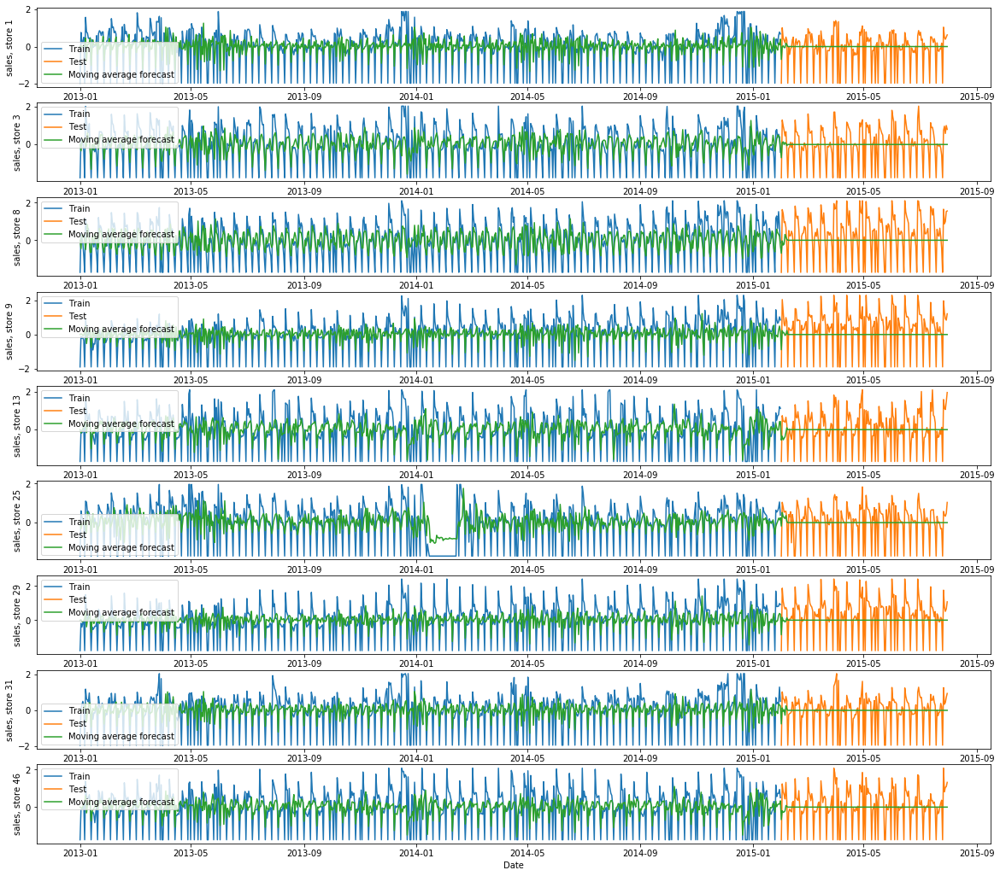

In [94]:
##Plotting predictions
## Important stores are 1,3,8,9,13,25,29,31 and 46

fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9) = plt.subplots(9, 1,figsize=(20,18))

ax1.plot(train1_univar['Sales'], label='Train')
ax1.plot(test1_univar['Sales'], label='Test')
ax1.plot(y_hat1['ma_forecast'][:'2015-07-31'], label='Moving average forecast')
ax1.legend(loc='best')
ax1.set_ylabel('sales, store 1')

ax2.plot(train3_univar['Sales'], label='Train')
ax2.plot(test3_univar['Sales'], label='Test')
ax2.plot(y_hat3['ma_forecast'][:'2015-07-31'], label='Moving average forecast')
ax2.legend(loc='best')
ax2.set_ylabel('sales, store 3')

ax3.plot(train8_univar['Sales'], label='Train')
ax3.plot(test8_univar['Sales'], label='Test')
ax3.plot(y_hat8['ma_forecast'][:'2015-07-31'], label='Moving average forecast')
ax3.legend(loc='best')
ax3.set_ylabel('sales, store 8')

ax4.plot(train9_univar['Sales'], label='Train')
ax4.plot(test9_univar['Sales'], label='Test')
ax4.plot(y_hat9['ma_forecast'][:'2015-07-31'], label='Moving average forecast')
ax4.legend(loc='best')
ax4.set_ylabel('sales, store 9')

ax5.plot(train13_univar['Sales'], label='Train')
ax5.plot(test13_univar['Sales'], label='Test')
ax5.plot(y_hat13['ma_forecast'][:'2015-07-31'], label='Moving average forecast')
ax5.legend(loc='best')
ax5.set_ylabel('sales, store 13')

ax6.plot(train25_univar['Sales'], label='Train')
ax6.plot(test25_univar['Sales'], label='Test')
ax6.plot(y_hat25['ma_forecast'][:'2015-07-31'], label='Moving average forecast')
ax6.legend(loc='best')
ax6.set_ylabel('sales, store 25')

ax7.plot(train29_univar['Sales'], label='Train')
ax7.plot(test29_univar['Sales'], label='Test')
ax7.plot(y_hat29['ma_forecast'][:'2015-07-31'], label='Moving average forecast')
ax7.legend(loc='best')
ax7.set_ylabel('sales, store 29')

ax8.plot(train31_univar['Sales'], label='Train')
ax8.plot(test31_univar['Sales'], label='Test')
ax8.plot(y_hat31['ma_forecast'][:'2015-07-31'], label='Moving average forecast')
ax8.legend(loc='best')
ax8.set_ylabel('sales, store 31')

ax9.plot(train46_univar['Sales'], label='Train')
ax9.plot(test46_univar['Sales'], label='Test')
ax9.plot(y_hat46['ma_forecast'][:'2015-07-31'], label='Moving average forecast')
ax9.legend(loc='best')
ax9.set_ylabel('sales, store 46')
ax9.set_xlabel('Date')

plt.show()

In [95]:
rmse_list_values = []
mape_list_values = []
for n,m,p,o in zip(rmse_list, mape_list, test_list, y_hat_list):
    n = np.sqrt(mean_squared_error(p['Sales'], o['ma_forecast'][p.index.min():p.index.max()])).round(2)
    m = np.round(np.mean(np.abs((p['Sales']-o['ma_forecast'][p.index.min():p.index.max()])/p['Sales']))*100,2)
    rmse_list_values.append(n)
    mape_list_values.append(m)
    #print(n,m)

In [96]:
tempResults = pd.DataFrame({'Method':['Moving Average (MA) method'], 'MAPE1': [mape_list_values[0]], 'RMSE1': [rmse_list_values[0]], 
                       'MAPE3': [mape_list_values[1]], 'RMSE3': [rmse_list_values[1]],  'MAPE8': [mape_list_values[2]], 'RMSE8': [rmse_list_values[2]],
                       'MAPE9': [mape_list_values[3]], 'RMSE9': [rmse_list_values[3]],   'MAPE13': [mape_list_values[4]], 'RMSE13': [rmse_list_values[4]],
                       'MAPE25': [mape_list_values[5]], 'RMSE25': [rmse_list_values[5]],   'MAPE29': [mape_list_values[6]], 'RMSE29': [rmse_list_values[5]],
                       'MAPE31': [mape_list_values[7]], 'RMSE31': [rmse_list_values[6]],   'MAPE46': [mape_list_values[8]], 'RMSE46': [rmse_list_values[7]]})

results = pd.concat([results, tempResults])

results = results[['Method', 'RMSE1', 'MAPE1', 'RMSE3', 'MAPE3', 'RMSE8', 'MAPE8', 'RMSE9', 'MAPE9', 'RMSE13', 'MAPE13'
                 , 'RMSE25', 'MAPE25', 'RMSE29', 'MAPE29', 'RMSE31', 'MAPE31', 'RMSE46', 'MAPE46']]
results

,Method,RMSE1,MAPE1,RMSE3,MAPE3,RMSE8,MAPE8,RMSE9,MAPE9,RMSE13,MAPE13,RMSE25,MAPE25,RMSE29,MAPE29,RMSE31,MAPE31,RMSE46,MAPE46
0,Autoregressive (AR) method,0.90,112.25,0.96,155.78,1.16,99.72,1.18,94.90,0.99,102.89,0.89,103.64,0.89,113.39,1.15,103.59,0.93,104.00
0,Moving Average (MA) method,0.93,99.85,0.97,99.46,1.17,99.90,1.22,99.53,1.00,101.66,0.91,98.23,0.91,100.98,1.17,99.98,0.97,100.58


## Auto regression moving average method (ARMA)

In [97]:
model1 = ARIMA(train1_univar['Sales'], order=(7, 0, 7)) 
model_fit1 = model1.fit()
print('store 1')
print( model_fit1.params)
print('\n')

model3 = ARIMA(train3_univar['Sales'], order=(7, 0, 7)) 
model_fit3 = model3.fit()
print('store 3')
print( model_fit3.params)
print('\n')

model8 = ARIMA(train8_univar['Sales'], order=(7, 0, 7)) 
model_fit8 = model8.fit()
print('store 8')
print( model_fit8.params)
print('\n')

model9 = ARIMA(train9_univar['Sales'], order=(7, 0, 7)) 
model_fit9 = model9.fit()
print('store 9')
print( model_fit9.params)
print('\n')

model13 = ARIMA(train13_univar['Sales'], order=(7, 0, 7)) 
model_fit13 = model13.fit()
print('store 13')
print( model_fit13.params)
print('\n')

model25 = ARIMA(train25_univar['Sales'], order=(7, 0, 7)) 
model_fit25 = model25.fit()
print('store 25')
print( model_fit25.params)
print('\n')

model29 = ARIMA(train29_univar['Sales'], order=(7, 0, 7)) 
model_fit29 = model29.fit()
print('store 29')
print( model_fit29.params)
print('\n')

model31 = ARIMA(train31_univar['Sales'], order=(7, 0, 7)) 
model_fit31 = model31.fit()
print('store 31')
print( model_fit31.params)
print('\n')

model46 = ARIMA(train46_univar['Sales'], order=(7, 0, 7)) 
model_fit46 = model46.fit()
print('store 46')
print( model_fit46.params)

store 1
const         -0.006123
ar.L1.Sales   -0.306555
ar.L2.Sales   -0.307937
ar.L3.Sales   -0.306965
ar.L4.Sales   -0.306971
ar.L5.Sales   -0.305847
ar.L6.Sales   -0.306412
ar.L7.Sales    0.693233
ma.L1.Sales    0.541421
ma.L2.Sales    0.545913
ma.L3.Sales    0.557854
ma.L4.Sales    0.541280
ma.L5.Sales    0.560991
ma.L6.Sales    0.538803
ma.L7.Sales   -0.431914
dtype: float64


store 3
const          0.081811
ar.L1.Sales   -0.498353
ar.L2.Sales   -0.501619
ar.L3.Sales   -0.500037
ar.L4.Sales   -0.500751
ar.L5.Sales   -0.498461
ar.L6.Sales   -0.501684
ar.L7.Sales    0.499329
ma.L1.Sales    0.771258
ma.L2.Sales    0.792802
ma.L3.Sales    0.818268
ma.L4.Sales    0.795590
ma.L5.Sales    0.792804
ma.L6.Sales    0.758584
ma.L7.Sales   -0.122657
dtype: float64


store 8
const         -0.003895
ar.L1.Sales   -0.337888
ar.L2.Sales   -0.338929
ar.L3.Sales   -0.338946
ar.L4.Sales   -0.337886
ar.L5.Sales   -0.337811
ar.L6.Sales   -0.337997
ar.L7.Sales    0.661609
ma.L1.Sales    0.713347
ma.L2.

In [98]:
##predicting values for all the 9 stores
y_hat1['arma_forecast'] = model_fit1.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat3['arma_forecast'] = model_fit3.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat8['arma_forecast'] = model_fit8.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat9['arma_forecast'] = model_fit9.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat13['arma_forecast'] = model_fit13.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat25['arma_forecast'] = model_fit25.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat29['arma_forecast'] = model_fit29.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat31['arma_forecast'] = model_fit31.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat46['arma_forecast'] = model_fit46.predict(y_hat1.index.min(), y_hat1.index.max())

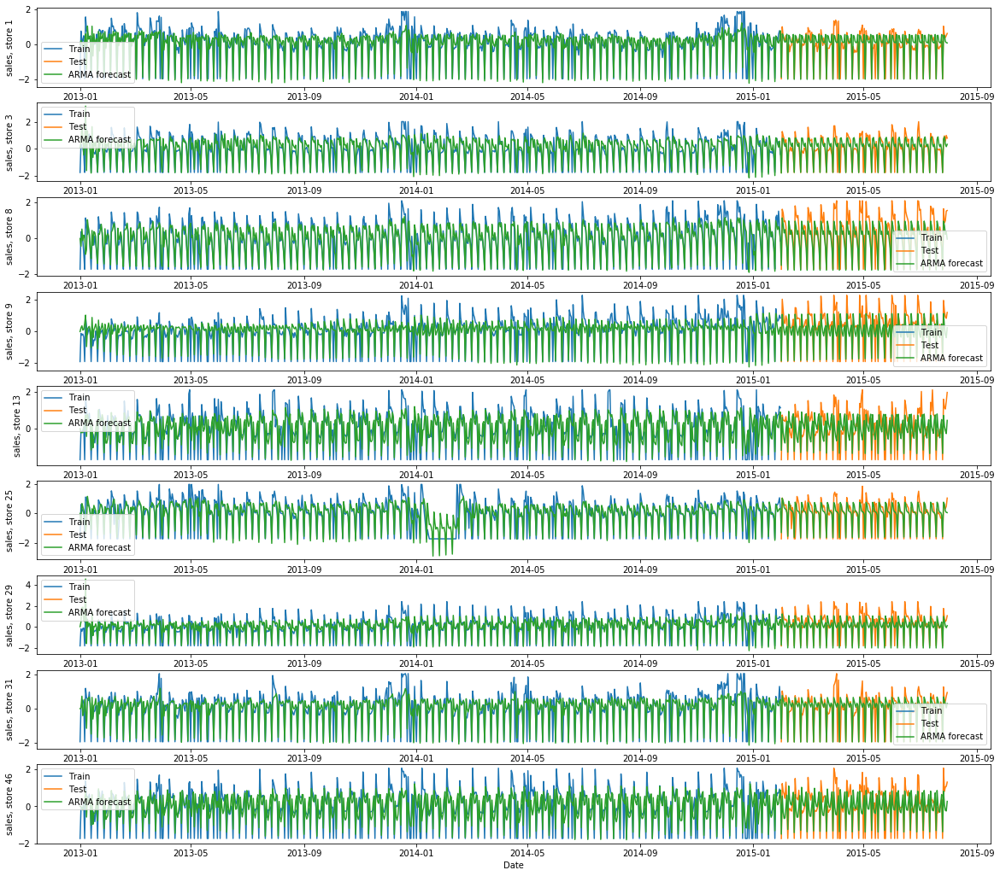

In [99]:
##Plotting predictions
## Important stores are 1,3,8,9,13,25,29,31 and 46

fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9) = plt.subplots(9, 1,figsize=(20,18))

ax1.plot(train1_univar['Sales'], label='Train')
ax1.plot(test1_univar['Sales'], label='Test')
ax1.plot(y_hat1['arma_forecast'][:'2015-07-31'], label='ARMA forecast')
ax1.legend(loc='best')
ax1.set_ylabel('sales, store 1')

ax2.plot(train3_univar['Sales'], label='Train')
ax2.plot(test3_univar['Sales'], label='Test')
ax2.plot(y_hat3['arma_forecast'][:'2015-07-31'], label='ARMA forecast')
ax2.legend(loc='best')
ax2.set_ylabel('sales, store 3')

ax3.plot(train8_univar['Sales'], label='Train')
ax3.plot(test8_univar['Sales'], label='Test')
ax3.plot(y_hat8['arma_forecast'][:'2015-07-31'], label='ARMA forecast')
ax3.legend(loc='best')
ax3.set_ylabel('sales, store 8')

ax4.plot(train9_univar['Sales'], label='Train')
ax4.plot(test9_univar['Sales'], label='Test')
ax4.plot(y_hat9['arma_forecast'][:'2015-07-31'], label='ARMA forecast')
ax4.legend(loc='best')
ax4.set_ylabel('sales, store 9')

ax5.plot(train13_univar['Sales'], label='Train')
ax5.plot(test13_univar['Sales'], label='Test')
ax5.plot(y_hat13['arma_forecast'][:'2015-07-31'], label='ARMA forecast')
ax5.legend(loc='best')
ax5.set_ylabel('sales, store 13')

ax6.plot(train25_univar['Sales'], label='Train')
ax6.plot(test25_univar['Sales'], label='Test')
ax6.plot(y_hat25['arma_forecast'][:'2015-07-31'], label='ARMA forecast')
ax6.legend(loc='best')
ax6.set_ylabel('sales, store 25')

ax7.plot(train29_univar['Sales'], label='Train')
ax7.plot(test29_univar['Sales'], label='Test')
ax7.plot(y_hat29['arma_forecast'][:'2015-07-31'], label='ARMA forecast')
ax7.legend(loc='best')
ax7.set_ylabel('sales, store 29')

ax8.plot(train31_univar['Sales'], label='Train')
ax8.plot(test31_univar['Sales'], label='Test')
ax8.plot(y_hat31['arma_forecast'][:'2015-07-31'], label='ARMA forecast')
ax8.legend(loc='best')
ax8.set_ylabel('sales, store 31')

ax9.plot(train46_univar['Sales'], label='Train')
ax9.plot(test46_univar['Sales'], label='Test')
ax9.plot(y_hat46['arma_forecast'][:'2015-07-31'], label='ARMA forecast')
ax9.legend(loc='best')
ax9.set_ylabel('sales, store 46')
ax9.set_xlabel('Date')

plt.show()

In [100]:
rmse_list_values = []
mape_list_values = []
for n,m,p,o in zip(rmse_list, mape_list, test_list, y_hat_list):
    n = np.sqrt(mean_squared_error(p['Sales'], o['arma_forecast'][p.index.min():p.index.max()])).round(2)
    m = np.round(np.mean(np.abs((p['Sales']-o['arma_forecast'][p.index.min():p.index.max()])/p['Sales']))*100,2)
    rmse_list_values.append(n)
    mape_list_values.append(m)
    #print(n,m)

In [101]:
tempResults = pd.DataFrame({'Method':['Autoregressive moving average (ARMA) method'], 'MAPE1': [mape_list_values[0]], 'RMSE1': [rmse_list_values[0]], 
                       'MAPE3': [mape_list_values[1]], 'RMSE3': [rmse_list_values[1]],  'MAPE8': [mape_list_values[2]], 'RMSE8': [rmse_list_values[2]],
                       'MAPE9': [mape_list_values[3]], 'RMSE9': [rmse_list_values[3]],   'MAPE13': [mape_list_values[4]], 'RMSE13': [rmse_list_values[4]],
                       'MAPE25': [mape_list_values[5]], 'RMSE25': [rmse_list_values[5]],   'MAPE29': [mape_list_values[6]], 'RMSE29': [rmse_list_values[5]],
                       'MAPE31': [mape_list_values[7]], 'RMSE31': [rmse_list_values[6]],   'MAPE46': [mape_list_values[8]], 'RMSE46': [rmse_list_values[7]]})

results = pd.concat([results, tempResults])

results = results[['Method', 'RMSE1', 'MAPE1', 'RMSE3', 'MAPE3', 'RMSE8', 'MAPE8', 'RMSE9', 'MAPE9', 'RMSE13', 'MAPE13'
                 , 'RMSE25', 'MAPE25', 'RMSE29', 'MAPE29', 'RMSE31', 'MAPE31', 'RMSE46', 'MAPE46']]
results

,Method,RMSE1,MAPE1,RMSE3,MAPE3,RMSE8,MAPE8,RMSE9,MAPE9,RMSE13,MAPE13,RMSE25,MAPE25,RMSE29,MAPE29,RMSE31,MAPE31,RMSE46,MAPE46
0,Autoregressive (AR) method,0.90,112.25,0.96,155.78,1.16,99.72,1.18,94.90,0.99,102.89,0.89,103.64,0.89,113.39,1.15,103.59,0.93,104.00
0,Moving Average (MA) method,0.93,99.85,0.97,99.46,1.17,99.90,1.22,99.53,1.00,101.66,0.91,98.23,0.91,100.98,1.17,99.98,0.97,100.58
0,Autoregressive moving average (ARMA) method,0.56,270.73,0.61,458.08,0.73,75.75,0.85,90.32,0.85,223.35,0.58,206.22,0.58,557.38,0.77,189.33,0.59,367.10


## Auto regressive integrated moving average (ARIMA)

**As series ia already stationary ARIMA and ARMA should have same result**

In [102]:
tempResults = pd.DataFrame({'Method':['Auto regressive integrated moving average (ARIMA)'], 'MAPE1': [mape_list_values[0]], 'RMSE1': [rmse_list_values[0]], 
                       'MAPE3': [mape_list_values[1]], 'RMSE3': [rmse_list_values[1]],  'MAPE8': [mape_list_values[2]], 'RMSE8': [rmse_list_values[2]],
                       'MAPE9': [mape_list_values[3]], 'RMSE9': [rmse_list_values[3]],   'MAPE13': [mape_list_values[4]], 'RMSE13': [rmse_list_values[4]],
                       'MAPE25': [mape_list_values[5]], 'RMSE25': [rmse_list_values[5]],   'MAPE29': [mape_list_values[6]], 'RMSE29': [rmse_list_values[5]],
                       'MAPE31': [mape_list_values[7]], 'RMSE31': [rmse_list_values[6]],   'MAPE46': [mape_list_values[8]], 'RMSE46': [rmse_list_values[7]]})

results = pd.concat([results, tempResults])

results = results[['Method', 'RMSE1', 'MAPE1', 'RMSE3', 'MAPE3', 'RMSE8', 'MAPE8', 'RMSE9', 'MAPE9', 'RMSE13', 'MAPE13'
                 , 'RMSE25', 'MAPE25', 'RMSE29', 'MAPE29', 'RMSE31', 'MAPE31', 'RMSE46', 'MAPE46']]
results

,Method,RMSE1,MAPE1,RMSE3,MAPE3,RMSE8,MAPE8,RMSE9,MAPE9,RMSE13,MAPE13,RMSE25,MAPE25,RMSE29,MAPE29,RMSE31,MAPE31,RMSE46,MAPE46
0,Autoregressive (AR) method,0.90,112.25,0.96,155.78,1.16,99.72,1.18,94.90,0.99,102.89,0.89,103.64,0.89,113.39,1.15,103.59,0.93,104.00
0,Moving Average (MA) method,0.93,99.85,0.97,99.46,1.17,99.90,1.22,99.53,1.00,101.66,0.91,98.23,0.91,100.98,1.17,99.98,0.97,100.58
0,Autoregressive moving average (ARMA) method,0.56,270.73,0.61,458.08,0.73,75.75,0.85,90.32,0.85,223.35,0.58,206.22,0.58,557.38,0.77,189.33,0.59,367.10
0,Auto regressive integrated moving average (ARIMA),0.56,270.73,0.61,458.08,0.73,75.75,0.85,90.32,0.85,223.35,0.58,206.22,0.58,557.38,0.77,189.33,0.59,367.10


## Seasonal auto regressive integrated moving average (SARIMA)

In [103]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model1 = SARIMAX(train1_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7)) 
model_fit1 = model1.fit()
print('store 1')
print( model_fit1.params)
print('\n')

model3 = SARIMAX(train3_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7)) 
model_fit3 = model3.fit()
print('store 3')
print( model_fit3.params)
print('\n')

model8 = SARIMAX(train8_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7)) 
model_fit8 = model8.fit()
print('store 8')
print( model_fit8.params)
print('\n')

model9 = SARIMAX(train9_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7)) 
model_fit9 = model9.fit()
print('store 9')
print( model_fit9.params)
print('\n')

model13 = SARIMAX(train13_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7)) 
model_fit13 = model13.fit()
print('store 13')
print( model_fit13.params)
print('\n')

model25 = SARIMAX(train25_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7)) 
model_fit25 = model25.fit()
print('store 25')
print( model_fit25.params)
print('\n')

model29 = SARIMAX(train29_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7)) 
model_fit29 = model29.fit()
print('store 29')
print( model_fit29.params)
print('\n')

model31 = SARIMAX(train31_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7)) 
model_fit31 = model31.fit()
print('store 31')
print( model_fit31.params)
print('\n')

model46 = SARIMAX(train46_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7)) 
model_fit46 = model46.fit()
print('store 46')
print( model_fit46.params)

store 1
ar.L1      0.065959
ar.L2     -0.090843
ar.L3      0.482104
ar.L4     -0.234153
ar.L5      0.158003
ar.L6     -0.748133
ma.L1      0.061311
ma.L2      0.250328
ma.L3     -0.318587
ma.L4      0.220226
ma.L5     -0.166794
ma.L6      0.707345
ar.S.L7    0.994915
ma.S.L7   -0.877566
sigma2     0.301060
dtype: float64


store 3
ar.L1      1.286919
ar.L2     -0.060892
ar.L3     -1.496465
ar.L4      1.189093
ar.L5      0.013366
ar.L6     -0.504466
ma.L1     -1.073559
ma.L2     -0.044750
ma.L3      1.407776
ma.L4     -0.919904
ma.L5     -0.172034
ma.L6      0.464755
ar.S.L7    0.997987
ma.S.L7   -0.922139
sigma2     0.305123
dtype: float64


store 8
ar.L1      0.318928
ar.L2      0.375680
ar.L3     -0.762674
ar.L4      0.481305
ar.L5      0.244943
ar.L6     -0.833828
ma.L1     -0.050704
ma.L2     -0.265646
ma.L3      0.750314
ma.L4     -0.329385
ma.L5     -0.301978
ma.L6      0.730470
ar.S.L7    0.996478
ma.S.L7   -0.904799
sigma2     0.246264
dtype: float64


store 9
ar.L1      0.0331

In [104]:
##predicting values for all the 9 stores
y_hat1['sarima_forecast'] = model_fit1.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat3['sarima_forecast'] = model_fit3.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat8['sarima_forecast'] = model_fit8.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat9['sarima_forecast'] = model_fit9.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat13['sarima_forecast'] = model_fit13.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat25['sarima_forecast'] = model_fit25.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat29['sarima_forecast'] = model_fit29.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat31['sarima_forecast'] = model_fit31.predict(y_hat1.index.min(), y_hat1.index.max())
y_hat46['sarima_forecast'] = model_fit46.predict(y_hat1.index.min(), y_hat1.index.max())

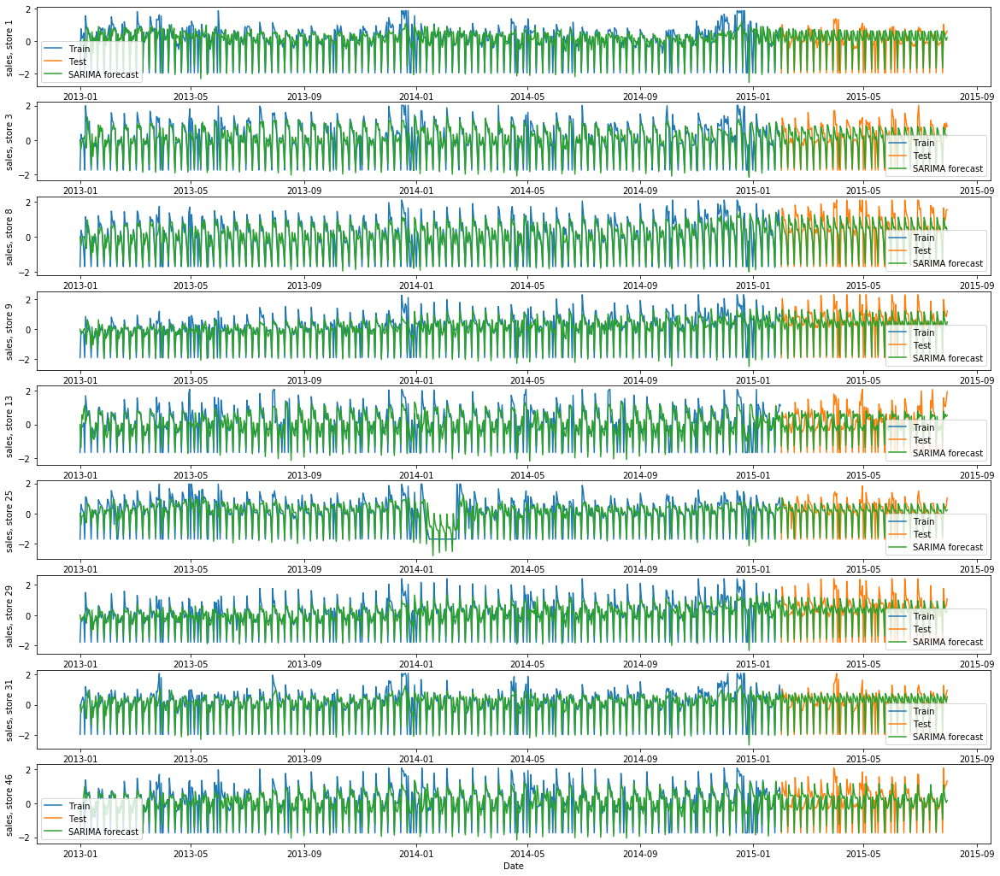

In [105]:
##Plotting predictions
## Important stores are 1,3,8,9,13,25,29,31 and 46

fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9) = plt.subplots(9, 1,figsize=(20,18))

ax1.plot(train1_univar['Sales'], label='Train')
ax1.plot(test1_univar['Sales'], label='Test')
ax1.plot(y_hat1['sarima_forecast'][:'2015-07-31'], label='SARIMA forecast')
ax1.legend(loc='best')
ax1.set_ylabel('sales, store 1')

ax2.plot(train3_univar['Sales'], label='Train')
ax2.plot(test3_univar['Sales'], label='Test')
ax2.plot(y_hat3['sarima_forecast'][:'2015-07-31'], label='SARIMA forecast')
ax2.legend(loc='best')
ax2.set_ylabel('sales, store 3')

ax3.plot(train8_univar['Sales'], label='Train')
ax3.plot(test8_univar['Sales'], label='Test')
ax3.plot(y_hat8['sarima_forecast'][:'2015-07-31'], label='SARIMA forecast')
ax3.legend(loc='best')
ax3.set_ylabel('sales, store 8')

ax4.plot(train9_univar['Sales'], label='Train')
ax4.plot(test9_univar['Sales'], label='Test')
ax4.plot(y_hat9['sarima_forecast'][:'2015-07-31'], label='SARIMA forecast')
ax4.legend(loc='best')
ax4.set_ylabel('sales, store 9')

ax5.plot(train13_univar['Sales'], label='Train')
ax5.plot(test13_univar['Sales'], label='Test')
ax5.plot(y_hat13['sarima_forecast'][:'2015-07-31'], label='SARIMA forecast')
ax5.legend(loc='best')
ax5.set_ylabel('sales, store 13')

ax6.plot(train25_univar['Sales'], label='Train')
ax6.plot(test25_univar['Sales'], label='Test')
ax6.plot(y_hat25['sarima_forecast'][:'2015-07-31'], label='SARIMA forecast')
ax6.legend(loc='best')
ax6.set_ylabel('sales, store 25')

ax7.plot(train29_univar['Sales'], label='Train')
ax7.plot(test29_univar['Sales'], label='Test')
ax7.plot(y_hat29['sarima_forecast'][:'2015-07-31'], label='SARIMA forecast')
ax7.legend(loc='best')
ax7.set_ylabel('sales, store 29')

ax8.plot(train31_univar['Sales'], label='Train')
ax8.plot(test31_univar['Sales'], label='Test')
ax8.plot(y_hat31['sarima_forecast'][:'2015-07-31'], label='SARIMA forecast')
ax8.legend(loc='best')
ax8.set_ylabel('sales, store 31')

ax9.plot(train46_univar['Sales'], label='Train')
ax9.plot(test46_univar['Sales'], label='Test')
ax9.plot(y_hat46['sarima_forecast'][:'2015-07-31'], label='SARIMA forecast')
ax9.legend(loc='best')
ax9.set_ylabel('sales, store 46')
ax9.set_xlabel('Date')

plt.show()

In [106]:
rmse_list_values = []
mape_list_values = []
for n,m,p,o in zip(rmse_list, mape_list, test_list, y_hat_list):
    n = np.sqrt(mean_squared_error(p['Sales'], o['sarima_forecast'][p.index.min():p.index.max()])).round(2)
    m = np.round(np.mean(np.abs((p['Sales']-o['sarima_forecast'][p.index.min():p.index.max()])/p['Sales']))*100,2)
    rmse_list_values.append(n)
    mape_list_values.append(m)
    #print(n,m)

In [107]:
tempResults = pd.DataFrame({'Method':['Seasonal autoregressive integrated moving average (SARIMA) method'], 'MAPE1': [mape_list_values[0]], 'RMSE1': [rmse_list_values[0]], 
                       'MAPE3': [mape_list_values[1]], 'RMSE3': [rmse_list_values[1]],  'MAPE8': [mape_list_values[2]], 'RMSE8': [rmse_list_values[2]],
                       'MAPE9': [mape_list_values[3]], 'RMSE9': [rmse_list_values[3]],   'MAPE13': [mape_list_values[4]], 'RMSE13': [rmse_list_values[4]],
                       'MAPE25': [mape_list_values[5]], 'RMSE25': [rmse_list_values[5]],   'MAPE29': [mape_list_values[6]], 'RMSE29': [rmse_list_values[5]],
                       'MAPE31': [mape_list_values[7]], 'RMSE31': [rmse_list_values[6]],   'MAPE46': [mape_list_values[8]], 'RMSE46': [rmse_list_values[7]]})

results = pd.concat([results, tempResults])

results = results[['Method', 'RMSE1', 'MAPE1', 'RMSE3', 'MAPE3', 'RMSE8', 'MAPE8', 'RMSE9', 'MAPE9', 'RMSE13', 'MAPE13'
                 , 'RMSE25', 'MAPE25', 'RMSE29', 'MAPE29', 'RMSE31', 'MAPE31', 'RMSE46', 'MAPE46']]
results

,Method,RMSE1,MAPE1,RMSE3,MAPE3,RMSE8,MAPE8,RMSE9,MAPE9,RMSE13,MAPE13,RMSE25,MAPE25,RMSE29,MAPE29,RMSE31,MAPE31,RMSE46,MAPE46
0,Autoregressive (AR) method,0.90,112.25,0.96,155.78,1.16,99.72,1.18,94.90,0.99,102.89,0.89,103.64,0.89,113.39,1.15,103.59,0.93,104.00
0,Moving Average (MA) method,0.93,99.85,0.97,99.46,1.17,99.90,1.22,99.53,1.00,101.66,0.91,98.23,0.91,100.98,1.17,99.98,0.97,100.58
0,Autoregressive moving average (ARMA) method,0.56,270.73,0.61,458.08,0.73,75.75,0.85,90.32,0.85,223.35,0.58,206.22,0.58,557.38,0.77,189.33,0.59,367.10
0,Auto regressive integrated moving average (ARIMA),0.56,270.73,0.61,458.08,0.73,75.75,0.85,90.32,0.85,223.35,0.58,206.22,0.58,557.38,0.77,189.33,0.59,367.10
0,Seasonal autoregressive integrated moving aver...,0.59,320.52,0.62,529.93,0.68,72.55,0.73,79.70,0.78,224.62,0.57,176.96,0.57,1251.02,0.75,234.41,0.61,256.84


## Seasonal auto regressive integrate moving average with exogenous variable (SARIMAX)

In [108]:
exog_var = ['Promo','DayOfWeek', 'StateHoliday','SchoolHoliday']

model1 = SARIMAX(train1_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7), exog=train1[exog_var]) 
model_fit1 = model1.fit()
print('store 1')
print( model_fit1.params)
print('\n')

model3 = SARIMAX(train3_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7), exog=train3[exog_var]) 
model_fit3 = model3.fit()
print('store 3')
print( model_fit3.params)
print('\n')

model8 = SARIMAX(train8_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7), exog=train8[exog_var]) 
model_fit8 = model8.fit()
print('store 8')
print( model_fit8.params)
print('\n')

model9 = SARIMAX(train9_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7), exog=train9[exog_var]) 
model_fit9 = model9.fit()
print('store 9')
print( model_fit9.params)
print('\n')

model13 = SARIMAX(train13_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7), exog=train13[exog_var]) 
model_fit13 = model13.fit()
print('store 13')
print( model_fit13.params)
print('\n')

model25 = SARIMAX(train25_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7), exog=train25[exog_var]) 
model_fit25 = model25.fit()
print('store 25')
print( model_fit25.params)
print('\n')

model29 = SARIMAX(train29_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7), exog=train29[exog_var]) 
model_fit29 = model29.fit()
print('store 29')
print( model_fit29.params)
print('\n')

model31 = SARIMAX(train31_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7), exog=train31[exog_var]) 
model_fit31 = model31.fit()
print('store 31')
print( model_fit31.params)
print('\n')

model46 = SARIMAX(train46_univar['Sales'], order=(6, 0, 6), seasonal_order=(1, 0, 1, 7), exog=train46[exog_var]) 
model_fit46 = model46.fit()
print('store 46')
print( model_fit46.params)

store 1
Promo            0.602077
DayOfWeek       -0.160376
StateHoliday    -2.488754
SchoolHoliday    0.004327
ar.L1            0.363589
ar.L2            0.804968
ar.L3           -0.094839
ar.L4           -0.647276
ar.L5           -0.058245
ar.L6            0.447031
ma.L1           -0.066892
ma.L2           -0.668899
ma.L3            0.033121
ma.L4            0.614437
ma.L5            0.282970
ma.L6           -0.437733
ar.S.L7          0.996511
ma.S.L7         -0.847118
sigma2           0.086195
dtype: float64


store 3
Promo            0.923309
DayOfWeek       -0.363045
StateHoliday    -2.205422
SchoolHoliday    0.125238
ar.L1           -0.811395
ar.L2           -0.558666
ar.L3           -0.339318
ar.L4           -0.220829
ar.L5           -0.232881
ar.L6           -0.352972
ma.L1            0.970714
ma.L2            0.918732
ma.L3            0.869527
ma.L4            0.844480
ma.L5            0.863388
ma.L6            0.928651
ar.S.L7          0.997312
ma.S.L7         -0.371260
sigma

In [109]:
##predicting values for all the 9 stores
y_hat1['sarimax_forecast'] = model_fit1.predict(y_hat1.index.min(), y_hat1.index.max(), exog=y_hat1[exog_var]['2015-02-01':])
y_hat3['sarimax_forecast'] = model_fit3.predict(y_hat1.index.min(), y_hat1.index.max(), exog=y_hat3[exog_var]['2015-02-01':])
y_hat8['sarimax_forecast'] = model_fit8.predict(y_hat1.index.min(), y_hat1.index.max(), exog=y_hat8[exog_var]['2015-02-01':])
y_hat9['sarimax_forecast'] = model_fit9.predict(y_hat1.index.min(), y_hat1.index.max(), exog=y_hat9[exog_var]['2015-02-01':])
y_hat13['sarimax_forecast'] = model_fit13.predict(y_hat1.index.min(), y_hat1.index.max(), exog=y_hat13[exog_var]['2015-02-01':])
y_hat25['sarimax_forecast'] = model_fit25.predict(y_hat1.index.min(), y_hat1.index.max(), exog=y_hat25[exog_var]['2015-02-01':])
y_hat29['sarimax_forecast'] = model_fit29.predict(y_hat1.index.min(), y_hat1.index.max(), exog=y_hat29[exog_var]['2015-02-01':])
y_hat31['sarimax_forecast'] = model_fit31.predict(y_hat1.index.min(), y_hat1.index.max(), exog=y_hat31[exog_var]['2015-02-01':])
y_hat46['sarimax_forecast'] = model_fit46.predict(y_hat1.index.min(), y_hat1.index.max(), exog=y_hat46[exog_var]['2015-02-01':])

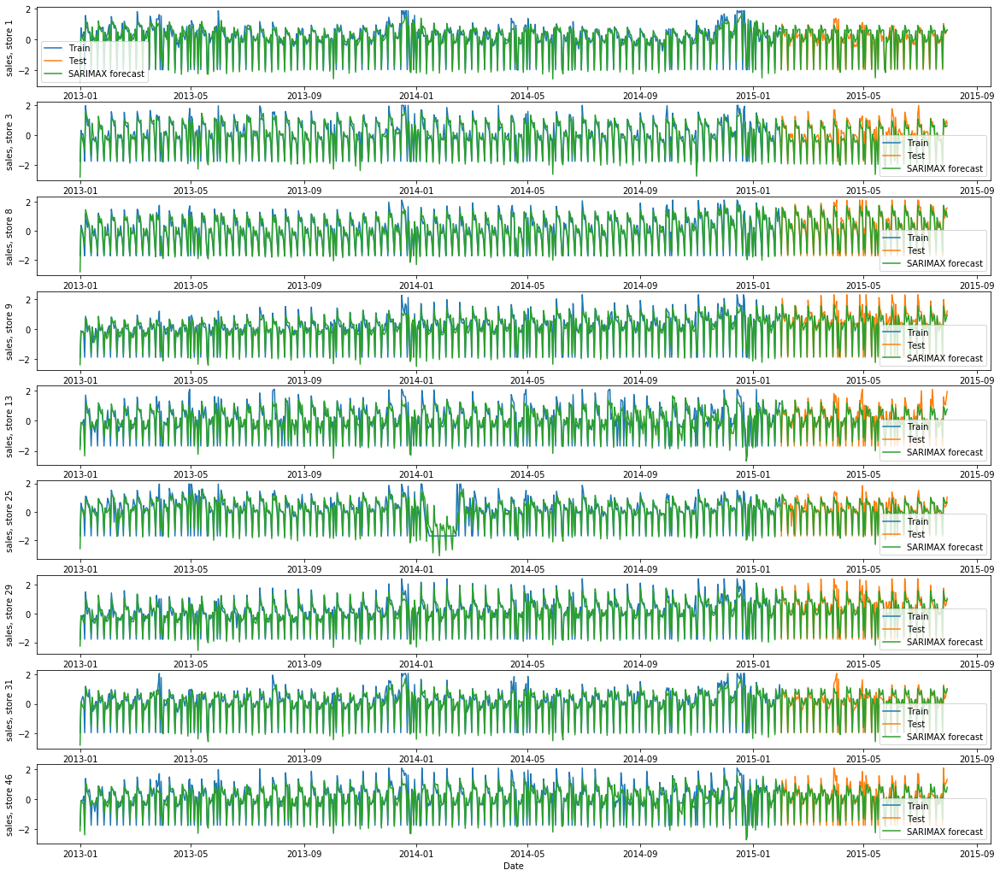

In [110]:
##Plotting predictions
## Important stores are 1,3,8,9,13,25,29,31 and 46

fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9) = plt.subplots(9, 1,figsize=(20,18))

ax1.plot(train1_univar['Sales'], label='Train')
ax1.plot(test1_univar['Sales'], label='Test')
ax1.plot(y_hat1['sarimax_forecast'][:'2015-07-31'], label='SARIMAX forecast')
ax1.legend(loc='best')
ax1.set_ylabel('sales, store 1')

ax2.plot(train3_univar['Sales'], label='Train')
ax2.plot(test3_univar['Sales'], label='Test')
ax2.plot(y_hat3['sarimax_forecast'][:'2015-07-31'], label='SARIMAX forecast')
ax2.legend(loc='best')
ax2.set_ylabel('sales, store 3')

ax3.plot(train8_univar['Sales'], label='Train')
ax3.plot(test8_univar['Sales'], label='Test')
ax3.plot(y_hat8['sarimax_forecast'][:'2015-07-31'], label='SARIMAX forecast')
ax3.legend(loc='best')
ax3.set_ylabel('sales, store 8')

ax4.plot(train9_univar['Sales'], label='Train')
ax4.plot(test9_univar['Sales'], label='Test')
ax4.plot(y_hat9['sarimax_forecast'][:'2015-07-31'], label='SARIMAX forecast')
ax4.legend(loc='best')
ax4.set_ylabel('sales, store 9')

ax5.plot(train13_univar['Sales'], label='Train')
ax5.plot(test13_univar['Sales'], label='Test')
ax5.plot(y_hat13['sarimax_forecast'][:'2015-07-31'], label='SARIMAX forecast')
ax5.legend(loc='best')
ax5.set_ylabel('sales, store 13')

ax6.plot(train25_univar['Sales'], label='Train')
ax6.plot(test25_univar['Sales'], label='Test')
ax6.plot(y_hat25['sarimax_forecast'][:'2015-07-31'], label='SARIMAX forecast')
ax6.legend(loc='best')
ax6.set_ylabel('sales, store 25')

ax7.plot(train29_univar['Sales'], label='Train')
ax7.plot(test29_univar['Sales'], label='Test')
ax7.plot(y_hat29['sarimax_forecast'][:'2015-07-31'], label='SARIMAX forecast')
ax7.legend(loc='best')
ax7.set_ylabel('sales, store 29')

ax8.plot(train31_univar['Sales'], label='Train')
ax8.plot(test31_univar['Sales'], label='Test')
ax8.plot(y_hat31['sarimax_forecast'][:'2015-07-31'], label='SARIMAX forecast')
ax8.legend(loc='best')
ax8.set_ylabel('sales, store 31')

ax9.plot(train46_univar['Sales'], label='Train')
ax9.plot(test46_univar['Sales'], label='Test')
ax9.plot(y_hat46['sarimax_forecast'][:'2015-07-31'], label='SARIMAX forecast')
ax9.legend(loc='best')
ax9.set_ylabel('sales, store 46')
ax9.set_xlabel('Date')

plt.show()

In [111]:
rmse_list_values = []
mape_list_values = []
for n,m,p,o in zip(rmse_list, mape_list, test_list, y_hat_list):
    n = np.sqrt(mean_squared_error(p['Sales'], o['sarimax_forecast'][p.index.min():p.index.max()])).round(2)
    m = np.round(np.mean(np.abs((p['Sales']-o['sarimax_forecast'][p.index.min():p.index.max()])/p['Sales']))*100,2)
    rmse_list_values.append(n)
    mape_list_values.append(m)
    #print(n,m)

In [112]:
tempResults = pd.DataFrame({'Method':['Seasonal auto regressive integrate moving average with exogenous variable (SARIMAX)'], 'MAPE1': [mape_list_values[0]], 'RMSE1': [rmse_list_values[0]], 
                       'MAPE3': [mape_list_values[1]], 'RMSE3': [rmse_list_values[1]],  'MAPE8': [mape_list_values[2]], 'RMSE8': [rmse_list_values[2]],
                       'MAPE9': [mape_list_values[3]], 'RMSE9': [rmse_list_values[3]],   'MAPE13': [mape_list_values[4]], 'RMSE13': [rmse_list_values[4]],
                       'MAPE25': [mape_list_values[5]], 'RMSE25': [rmse_list_values[5]],   'MAPE29': [mape_list_values[6]], 'RMSE29': [rmse_list_values[5]],
                       'MAPE31': [mape_list_values[7]], 'RMSE31': [rmse_list_values[6]],   'MAPE46': [mape_list_values[8]], 'RMSE46': [rmse_list_values[7]]})

results = pd.concat([results, tempResults])

results = results[['Method', 'RMSE1', 'MAPE1', 'RMSE3', 'MAPE3', 'RMSE8', 'MAPE8', 'RMSE9', 'MAPE9', 'RMSE13', 'MAPE13'
                 , 'RMSE25', 'MAPE25', 'RMSE29', 'MAPE29', 'RMSE31', 'MAPE31', 'RMSE46', 'MAPE46']]
results

,Method,RMSE1,MAPE1,RMSE3,MAPE3,RMSE8,MAPE8,RMSE9,MAPE9,RMSE13,MAPE13,RMSE25,MAPE25,RMSE29,MAPE29,RMSE31,MAPE31,RMSE46,MAPE46
0,Autoregressive (AR) method,0.90,112.25,0.96,155.78,1.16,99.72,1.18,94.90,0.99,102.89,0.89,103.64,0.89,113.39,1.15,103.59,0.93,104.00
0,Moving Average (MA) method,0.93,99.85,0.97,99.46,1.17,99.90,1.22,99.53,1.00,101.66,0.91,98.23,0.91,100.98,1.17,99.98,0.97,100.58
0,Autoregressive moving average (ARMA) method,0.56,270.73,0.61,458.08,0.73,75.75,0.85,90.32,0.85,223.35,0.58,206.22,0.58,557.38,0.77,189.33,0.59,367.10
0,Auto regressive integrated moving average (ARIMA),0.56,270.73,0.61,458.08,0.73,75.75,0.85,90.32,0.85,223.35,0.58,206.22,0.58,557.38,0.77,189.33,0.59,367.10
0,Seasonal autoregressive integrated moving aver...,0.59,320.52,0.62,529.93,0.68,72.55,0.73,79.70,0.78,224.62,0.57,176.96,0.57,1251.02,0.75,234.41,0.61,256.84
0,Seasonal auto regressive integrate moving aver...,0.32,285.66,0.37,612.45,0.28,41.40,0.39,48.37,0.45,88.61,0.36,122.62,0.36,201.50,0.39,144.14,0.33,223.21


## Vector Autoregression Model (VAR)

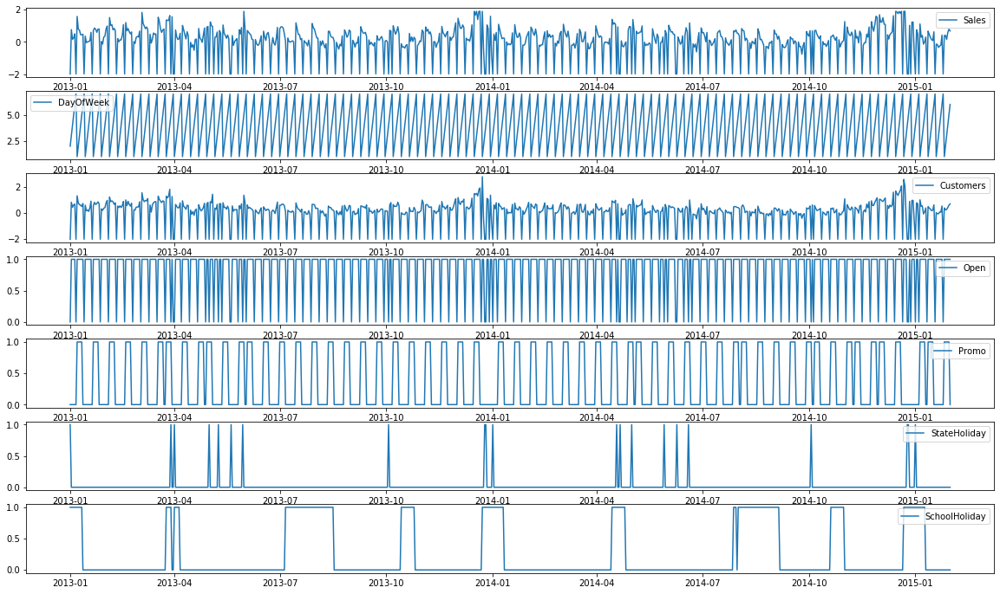

In [113]:
##Visulising other parameters

fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7) = plt.subplots(7,1,figsize=(20,12))

ax1.plot(train1['Sales'], label = 'Sales')
ax1.legend()

ax2.plot(train1['DayOfWeek'], label = 'DayOfWeek')
ax2.legend()

ax3.plot(train1['Customers'], label = 'Customers')
ax3.legend()

ax4.plot(train1['Open'], label = 'Open')
ax4.legend()

ax5.plot(train1['Promo'], label = 'Promo')
ax5.legend()

ax6.plot(train1['StateHoliday'], label = 'StateHoliday')
ax6.legend()

ax7.plot(train1['SchoolHoliday'], label = 'SchoolHoliday')
ax7.legend()

plt.show()

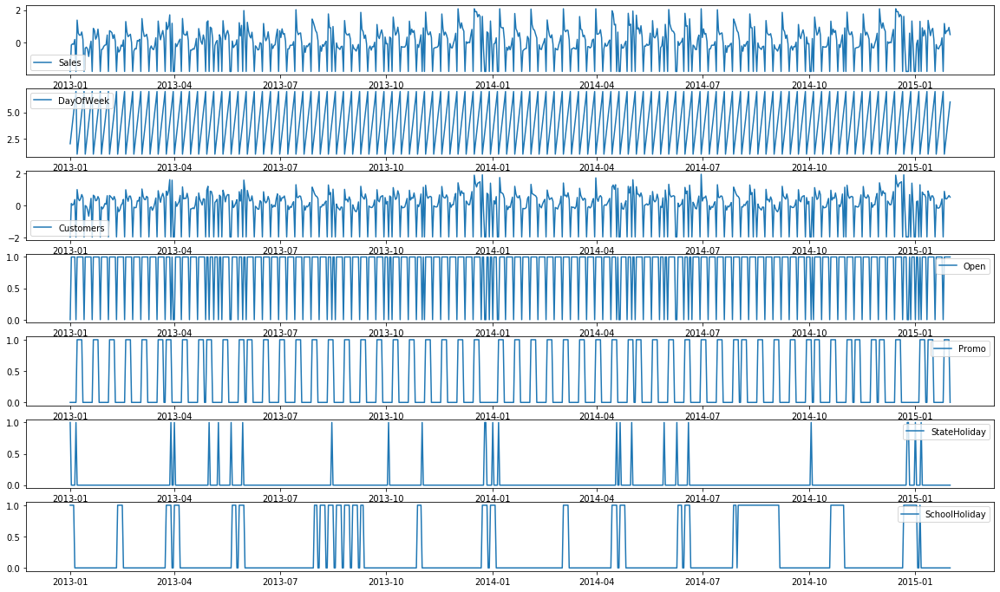

In [114]:
##Visulising other parameters
##graphs for different variables plotted for understanding

fig, (ax1,ax2,ax3,ax4,ax5,ax6,ax7) = plt.subplots(7,1,figsize=(20,12))

ax1.plot(train46['Sales'], label = 'Sales')
ax1.legend()

ax2.plot(train46['DayOfWeek'], label = 'DayOfWeek')
ax2.legend()

ax3.plot(train46['Customers'], label = 'Customers')
ax3.legend()

ax4.plot(train46['Open'], label = 'Open')
ax4.legend()

ax5.plot(train46['Promo'], label = 'Promo')
ax5.legend()

ax6.plot(train46['StateHoliday'], label = 'StateHoliday')
ax6.legend()

ax7.plot(train46['SchoolHoliday'], label = 'SchoolHoliday')
ax7.legend()

plt.show()

In [115]:
from statsmodels.tsa.stattools import grangercausalitytests
maxlag=12
test = 'ssr_chi2test'
def grangers_causation_matrix(data, variables, test='ssr_chi2test', verbose=False):    
    """Check Granger Causality of all possible combinations of the Time series.
    The rows are the response variable, columns are predictors. The values in the table 
    are the P-Values. P-Values lesser than the significance level (0.05), implies 
    the Null Hypothesis that the coefficients of the corresponding past values is 
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.
    """
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

In [116]:
train_list = [train1, train3, train8, train9, train13, train25, train29, train31, train46]

In [117]:
##naming for ref
train1.name = 'train1'
train3.name = 'train3'
train8.name = 'train8'
train9.name = 'train9'
train13.name = 'train13'
train25.name = 'train25'
train29.name = 'train29'
train31.name = 'train31'
train46.name = 'train46'

In [118]:
for n in train_list :
    print(grangers_causation_matrix(n, variables = train1.columns.drop(['Store']))   )
    print('\n')

                 DayOfWeek_x  Sales_x  Customers_x  Open_x  Promo_x  \
DayOfWeek_y           0.0000      0.0          0.0  0.0000   0.0000   
Sales_y               0.0000      1.0          0.0  0.0000   0.0000   
Customers_y           0.0000      0.0          1.0  0.0000   0.0000   
Open_y                0.0000      0.0          0.0  1.0000   0.0000   
Promo_y               0.0000      0.0          0.0  0.0000   1.0000   
StateHoliday_y        0.0006      0.0          0.0  0.0003   0.0111   
SchoolHoliday_y       0.0000      0.0          0.0  0.0000   0.0001   

                 StateHoliday_x  SchoolHoliday_x  
DayOfWeek_y              0.0000           0.0000  
Sales_y                  0.0000           0.0000  
Customers_y              0.0000           0.0000  
Open_y                   0.0000           0.0000  
Promo_y                  0.0003           0.0375  
StateHoliday_y           1.0000           0.0000  
SchoolHoliday_y          0.0319           1.0000  


                 DayO

**Looking at the P-Values in the above table, you can pretty much observe that all the variables (time series) in the system are interchangeably causing each other.**

In [119]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen

def cointegration_test(df, alpha=0.05): 
    """Perform Johanson's Cointegration Test and Report Summary"""
    out = coint_johansen(df,-1,5)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)


In [120]:
for n in train_list :
    print(cointegration_test(n[['DayOfWeek', 'Sales', 'Customers', 'Promo', 'SchoolHoliday',
       'StateHoliday']])   )
    print('\n')

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
DayOfWeek ::  484.62    > 83.9383   =>   True
Sales  ::  312.14    > 60.0627   =>   True
Customers ::  164.64    > 40.1749   =>   True
Promo  ::  80.92     > 24.2761   =>   True
SchoolHoliday ::  30.21     > 12.3212   =>   True
StateHoliday ::  0.23      > 4.1296    =>   False
None


Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
DayOfWeek ::  533.93    > 83.9383   =>   True
Sales  ::  348.1     > 60.0627   =>   True
Customers ::  201.18    > 40.1749   =>   True
Promo  ::  77.97     > 24.2761   =>   True
SchoolHoliday ::  23.06     > 12.3212   =>   True
StateHoliday ::  0.31      > 4.1296    =>   False
None


Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
DayOfWeek ::  518.77    > 83.9383   =>   True
Sales  ::  337.88    > 60.0627   =>   True
Customers ::  174.65    > 40.1749   =>   True
Promo  ::  64.11     > 24.27

#### When two or more time series are cointegrated, it means they have a long run, statistically significant relationship.

In [121]:
def adfuller_test(series, signif=0.05, name='', verbose=False):
    """Perform ADFuller to test for Stationarity of given series and print report"""
    r = adfuller(series, autolag='AIC')
    output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue'] 
    def adjust(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print(f'    Augmented Dickey-Fuller Test on "{name}"', "\n   ", '-'*47)
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")    

In [122]:
# ADF Test on each column
for n in train_list:
    print(n.name)
    for name, column in n[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
           'StateHoliday']].iteritems():
        adfuller_test(column, name=column.name)
        #print('\n')
    print('-----------------------------------------')
    print('-----------------------------------------')

train1
    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -373404718800033.2
 No. Lags Chosen       = 7
 Critical value 1%     = -3.439
 Critical value 5%     = -2.865
 Critical value 10%    = -2.569
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
    Augmented Dickey-Fuller Test on "Sales" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.6584
 No. Lags Chosen       = 20
 Critical value 1%     = -3.439
 Critical value 5%     = -2.865
 Critical value 10%    = -2.569
 => P-Value = 0.0047. Rejecting Null Hypothesis.
 => Series is Stationary.
    Augmented Dickey-Fuller Test on "Customers" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 

    Augmented Dickey-Fuller Test on "SchoolHoliday" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.8779
 No. Lags Chosen       = 12
 Critical value 1%     = -3.439
 Critical value 5%     = -2.865
 Critical value 10%    = -2.569
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
    Augmented Dickey-Fuller Test on "StateHoliday" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -6.6937
 No. Lags Chosen       = 10
 Critical value 1%     = -3.439
 Critical value 5%     = -2.865
 Critical value 10%    = -2.569
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
-----------------------------------------
-----------------------------------------
train13
    Augmented Dickey-Fuller Test on "DayOfWeek" 
    --------------------

    Augmented Dickey-Fuller Test on "StateHoliday" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -6.6937
 No. Lags Chosen       = 10
 Critical value 1%     = -3.439
 Critical value 5%     = -2.865
 Critical value 10%    = -2.569
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
-----------------------------------------
-----------------------------------------
train31
    Augmented Dickey-Fuller Test on "DayOfWeek" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -373404718800033.2
 No. Lags Chosen       = 7
 Critical value 1%     = -3.439
 Critical value 5%     = -2.865
 Critical value 10%    = -2.569
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
    Augmented Dickey-Fuller Test on "Sales" 
    ------------------

#### All attributes in all 9 stores are statationary

In [123]:
### VAR Model
from statsmodels.tsa.api import VAR

model1 = VAR(train1[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']])
for i in [1,2,3,4,5,6,7,8,9]:
    result = model1.fit(i)
    print('model1')
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic)
print('--------------------------------------------------')
    
model3 = VAR(train3[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']])
for i in [1,2,3,4,5,6,7,8,9]:
    result = model3.fit(i)
    print('model3')
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic)
print('--------------------------------------------------')

model8 = VAR(train8[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']])
for i in [1,2,3,4,5,6,7,8,9]:
    result = model8.fit(i)
    print('model8')
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic)
print('--------------------------------------------------')
    
model9 = VAR(train9[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']])
for i in [1,2,3,4,5,6,7,8,9]:
    result = model9.fit(i)
    print('model9')
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic)
print('--------------------------------------------------')
    
model13 = VAR(train13[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']])
for i in [1,2,3,4,5,6,7,8,9]:
    result = model13.fit(i)
    print('model13')
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic)
print('--------------------------------------------------')
    
model25 = VAR(train25[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']])
for i in [1,2,3,4,5,6,7,8,9]:
    result = model25.fit(i)
    print('model25')
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic)
print('--------------------------------------------------')
    
model29 = VAR(train29[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']])
for i in [1,2,3,4,5,6,7,8,9]:
    result = model29.fit(i)
    print('model29')
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic)
print('--------------------------------------------------')
    
model31 = VAR(train31[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']])
for i in [1,2,3,4,5,6,7,8,9]:
    result = model31.fit(i)
    print('model31')
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic)
print('--------------------------------------------------')
    
model46 = VAR(train46[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']])
for i in [1,2,3,4,5,6,7,8,9]:
    result = model46.fit(i)
    print('model46')
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic)
print('--------------------------------------------------')

model1
Lag Order = 1
AIC :  -81.83850699481866
BIC :  -81.49710458394537
FPE :  2.8707169194618697e-36
HQIC:  -81.70703886055036
model1
Lag Order = 2
AIC :  -83.21075151041721
BIC :  -82.56996075069844
FPE :  7.27855941273912e-37
HQIC:  -82.96397890959304
model1
Lag Order = 3
AIC :  -82.54699143757409
BIC :  -81.60619296608475
FPE :  1.413665622313284e-36
HQIC:  -82.1846615891807
model1
Lag Order = 4
AIC :  -82.5739436640985
BIC :  -81.33251600168396
FPE :  1.3762773536220922e-36
HQIC:  -82.09580290279293
model1
Lag Order = 5
AIC :  -102.48373979596644
BIC :  -100.94105933723993
FPE :  3.105249233894706e-45
HQIC:  -101.88953356784708
model1
Lag Order = 6
AIC :  -120.78917162351183
BIC :  -118.94461262679135
FPE :  3.485815828895123e-53
HQIC:  -120.07864448186386
model1
Lag Order = 7
AIC :  -101.89244692407019
BIC :  -99.74538150125483
FPE :  5.61390574736726e-45
HQIC:  -101.0653425250851
model1
Lag Order = 8
AIC :  -103.05966518688629
BIC :  -100.6094632932712
FPE :  1.7483896302491934

model29
Lag Order = 9
AIC :  -103.68224472818562
BIC :  -100.92827415221551
FPE :  9.389187930013728e-46
HQIC:  -102.62121317316755
--------------------------------------------------
model31
Lag Order = 1
AIC :  -80.555780941862
BIC :  -80.21437853098871
FPE :  1.0353119230719773e-35
HQIC:  -80.4243128075937
model31
Lag Order = 2
AIC :  -81.78877040907479
BIC :  -81.14797964935602
FPE :  3.0171991525070544e-36
HQIC:  -81.54199780825061
model31
Lag Order = 3
AIC :  -81.32280787333528
BIC :  -80.38200940184593
FPE :  4.8084251905998194e-36
HQIC:  -80.96047802494189
model31
Lag Order = 4
AIC :  -81.8084484282867
BIC :  -80.56702076587217
FPE :  2.9590773691727872e-36
HQIC:  -81.33030766698113
model31
Lag Order = 5
AIC :  -100.77042749185767
BIC :  -99.22774703313117
FPE :  1.722576597726716e-44
HQIC:  -100.17622126373831
model31
Lag Order = 6
AIC :  -119.58377001343734
BIC :  -117.73921101671687
FPE :  1.1635999808023157e-52
HQIC:  -118.87324287178937
model31
Lag Order = 7
AIC :  -104.944

#### Considering all the positive eigen values
- minimum lags as follows
- model1 -6 , model3- 6 ,model8 - 6 ,model9 - 6 ,model13-7 ,model25-8 ,model29-6 ,model31-6 ,model46-8

In [124]:
##fitting moodels
model_fitted1 = model1.fit(6)
model_fitted3 = model3.fit(6)
model_fitted8 = model8.fit(6)
model_fitted9 = model9.fit(6)
model_fitted13 = model13.fit(7)
model_fitted25 = model25.fit(8)
model_fitted29 = model29.fit(6)
model_fitted31 = model31.fit(6)
model_fitted46= model46.fit(8)

In [125]:
# Get the lag order
# Input data for forecasting
print('model1')
lag_order = model_fitted1.k_ar
print(lag_order)  #> 4
forecast_input1 = train1[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']].values[-lag_order:]

print('model3')
lag_order = model_fitted3.k_ar
print(lag_order)  #> 4
forecast_input3 = train3[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']].values[-lag_order:]

print('model8')
lag_order = model_fitted8.k_ar
print(lag_order)  #> 4
forecast_input8 = train8[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']].values[-lag_order:]

print('model9')
lag_order = model_fitted9.k_ar
print(lag_order)  #> 4
forecast_input9 = train9[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']].values[-lag_order:]

print('model13')
lag_order = model_fitted13.k_ar
print(lag_order)  #> 4
forecast_input13 = train13[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']].values[-lag_order:]

print('model25')
lag_order = model_fitted25.k_ar
print(lag_order)  #> 4
forecast_input25 = train25[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']].values[-lag_order:]

print('model29')
lag_order = model_fitted29.k_ar
print(lag_order)  #> 4
forecast_input29 = train29[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']].values[-lag_order:]

print('model31')
lag_order = model_fitted31.k_ar
print(lag_order)  #> 4
forecast_input31 = train31[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']].values[-lag_order:]

print('model46')
lag_order = model_fitted46.k_ar
print(lag_order)  #> 4
forecast_input46 = train46[['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday']].values[-lag_order:]

model1
6
model3
6
model8
6
model9
6
model13
7
model25
8
model29
6
model31
6
model46
8


In [126]:
# Forecast
steps = 223
fc1 = model_fitted1.forecast(y=forecast_input1,steps = 223)
df_forecast1 = pd.DataFrame(fc1, index=y_hat1.index[-steps:],columns =['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday'])

fc3 = model_fitted3.forecast(y=forecast_input3,steps = 223)
df_forecast3 = pd.DataFrame(fc3, index=y_hat3.index[-steps:],columns =['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday'])

fc8 = model_fitted8.forecast(y=forecast_input8,steps = 223)
df_forecast8 = pd.DataFrame(fc8, index=y_hat8.index[-steps:],columns =['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday'])

fc9 = model_fitted9.forecast(y=forecast_input9,steps = 223)
df_forecast9 = pd.DataFrame(fc9, index=y_hat9.index[-steps:],columns =['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday'])

fc13 = model_fitted13.forecast(y=forecast_input13,steps = 223)
df_forecast13 = pd.DataFrame(fc13, index=y_hat13.index[-steps:],columns =['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday'])

fc25 = model_fitted25.forecast(y=forecast_input25,steps = 223)
df_forecast25 = pd.DataFrame(fc25, index=y_hat25.index[-steps:],columns =['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday'])

fc29 = model_fitted29.forecast(y=forecast_input29,steps = 223)
df_forecast29 = pd.DataFrame(fc29, index=y_hat29.index[-steps:],columns =['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday'])

fc31 = model_fitted31.forecast(y=forecast_input31,steps = 223)
df_forecast31 = pd.DataFrame(fc31, index=y_hat31.index[-steps:],columns =['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday'])

fc46 = model_fitted46.forecast(y=forecast_input46,steps = 223)
df_forecast46 = pd.DataFrame(fc46, index=y_hat46.index[-steps:],columns =['DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'StateHoliday'])

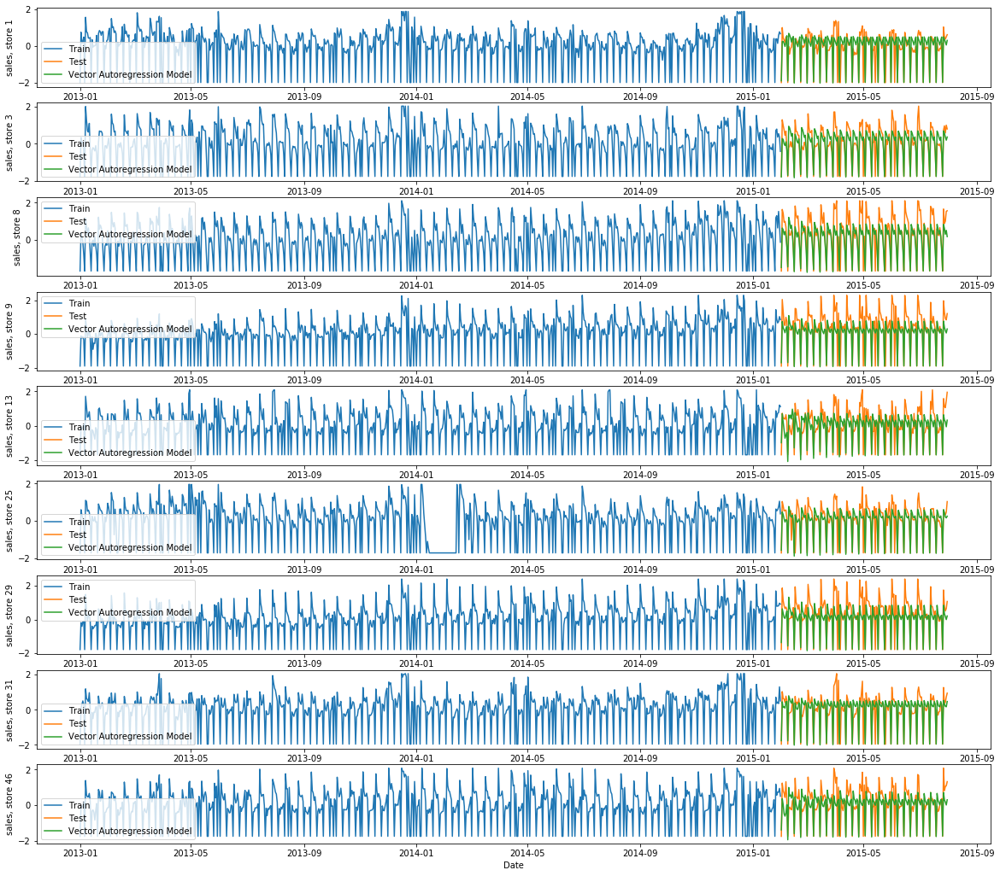

In [127]:
##Plotting predictions
## Important stores are 1,3,8,9,13,25,29,31 and 46

fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9) = plt.subplots(9, 1,figsize=(20,18))

ax1.plot(train1_univar['Sales'], label='Train')
ax1.plot(test1_univar['Sales'], label='Test')
ax1.plot(df_forecast1['Sales'][:181], label='Vector Autoregression Model')
ax1.legend(loc='best')
ax1.set_ylabel('sales, store 1')

ax2.plot(train3_univar['Sales'], label='Train')
ax2.plot(test3_univar['Sales'], label='Test')
ax2.plot(df_forecast3['Sales'][:181], label='Vector Autoregression Model')
ax2.legend(loc='best')
ax2.set_ylabel('sales, store 3')

ax3.plot(train8_univar['Sales'], label='Train')
ax3.plot(test8_univar['Sales'], label='Test')
ax3.plot(df_forecast8['Sales'][:181], label='Vector Autoregression Model')
ax3.legend(loc='best')
ax3.set_ylabel('sales, store 8')

ax4.plot(train9_univar['Sales'], label='Train')
ax4.plot(test9_univar['Sales'], label='Test')
ax4.plot(df_forecast9['Sales'][:181], label='Vector Autoregression Model')
ax4.legend(loc='best')
ax4.set_ylabel('sales, store 9')

ax5.plot(train13_univar['Sales'], label='Train')
ax5.plot(test13_univar['Sales'], label='Test')
ax5.plot(df_forecast13['Sales'][:181], label='Vector Autoregression Model')
ax5.legend(loc='best')
ax5.set_ylabel('sales, store 13')

ax6.plot(train25_univar['Sales'], label='Train')
ax6.plot(test25_univar['Sales'], label='Test')
ax6.plot(df_forecast25['Sales'][:181], label='Vector Autoregression Model')
ax6.legend(loc='best')
ax6.set_ylabel('sales, store 25')

ax7.plot(train29_univar['Sales'], label='Train')
ax7.plot(test29_univar['Sales'], label='Test')
ax7.plot(df_forecast29['Sales'][:181], label='Vector Autoregression Model')
ax7.legend(loc='best')
ax7.set_ylabel('sales, store 29')

ax8.plot(train31_univar['Sales'], label='Train')
ax8.plot(test31_univar['Sales'], label='Test')
ax8.plot(df_forecast31['Sales'][:181], label='Vector Autoregression Model')
ax8.legend(loc='best')
ax8.set_ylabel('sales, store 31')

ax9.plot(train46_univar['Sales'], label='Train')
ax9.plot(test46_univar['Sales'], label='Test')
ax9.plot(df_forecast46['Sales'][:181], label='Vector Autoregression Model')
ax9.legend(loc='best')
ax9.set_ylabel('sales, store 46')
ax9.set_xlabel('Date')

plt.show()

In [128]:
df_forecast_list = [df_forecast1,df_forecast3,df_forecast8,df_forecast9,df_forecast13,df_forecast25,df_forecast29
                   ,df_forecast31,df_forecast46]

In [129]:
rmse_list_values = []
mape_list_values = []
for n,m,p,o in zip(rmse_list, mape_list, test_list, df_forecast_list):
    n = np.sqrt(mean_squared_error(p['Sales'], o['Sales'][:181])).round(2)
    m = np.round(np.mean(np.abs((p['Sales']-o['Sales'][:181])/p['Sales']))*100,2)
    rmse_list_values.append(n)
    mape_list_values.append(m)
    #print(n,m)

In [130]:
tempResults = pd.DataFrame({'Method':['Vector Autoregression Model'], 'MAPE1': [mape_list_values[0]], 'RMSE1': [rmse_list_values[0]], 
                       'MAPE3': [mape_list_values[1]], 'RMSE3': [rmse_list_values[1]],  'MAPE8': [mape_list_values[2]], 'RMSE8': [rmse_list_values[2]],
                       'MAPE9': [mape_list_values[3]], 'RMSE9': [rmse_list_values[3]],   'MAPE13': [mape_list_values[4]], 'RMSE13': [rmse_list_values[4]],
                       'MAPE25': [mape_list_values[5]], 'RMSE25': [rmse_list_values[5]],   'MAPE29': [mape_list_values[6]], 'RMSE29': [rmse_list_values[5]],
                       'MAPE31': [mape_list_values[7]], 'RMSE31': [rmse_list_values[6]],   'MAPE46': [mape_list_values[8]], 'RMSE46': [rmse_list_values[7]]})

results = pd.concat([results, tempResults])

results = results[['Method', 'RMSE1', 'MAPE1', 'RMSE3', 'MAPE3', 'RMSE8', 'MAPE8', 'RMSE9', 'MAPE9', 'RMSE13', 'MAPE13'
                 , 'RMSE25', 'MAPE25', 'RMSE29', 'MAPE29', 'RMSE31', 'MAPE31', 'RMSE46', 'MAPE46']]
results

,Method,RMSE1,MAPE1,RMSE3,MAPE3,RMSE8,MAPE8,RMSE9,MAPE9,RMSE13,MAPE13,RMSE25,MAPE25,RMSE29,MAPE29,RMSE31,MAPE31,RMSE46,MAPE46
0,Autoregressive (AR) method,0.90,112.25,0.96,155.78,1.16,99.72,1.18,94.90,0.99,102.89,0.89,103.64,0.89,113.39,1.15,103.59,0.93,104.00
0,Moving Average (MA) method,0.93,99.85,0.97,99.46,1.17,99.90,1.22,99.53,1.00,101.66,0.91,98.23,0.91,100.98,1.17,99.98,0.97,100.58
0,Autoregressive moving average (ARMA) method,0.56,270.73,0.61,458.08,0.73,75.75,0.85,90.32,0.85,223.35,0.58,206.22,0.58,557.38,0.77,189.33,0.59,367.10
0,Auto regressive integrated moving average (ARIMA),0.56,270.73,0.61,458.08,0.73,75.75,0.85,90.32,0.85,223.35,0.58,206.22,0.58,557.38,0.77,189.33,0.59,367.10
0,Seasonal autoregressive integrated moving aver...,0.59,320.52,0.62,529.93,0.68,72.55,0.73,79.70,0.78,224.62,0.57,176.96,0.57,1251.02,0.75,234.41,0.61,256.84
0,Seasonal auto regressive integrate moving aver...,0.32,285.66,0.37,612.45,0.28,41.40,0.39,48.37,0.45,88.61,0.36,122.62,0.36,201.50,0.39,144.14,0.33,223.21
0,Vector Autoregression Model,0.57,322.24,0.63,556.43,0.74,74.65,0.80,64.91,0.74,186.66,0.58,193.70,0.58,664.31,0.81,197.08,0.60,219.55


**Best model is one which has lowest RMSE and MAPE**
- **Overall considering both RMSE and MAPE, optimum solution can be seen at 'SARIMAX' and 'Vector Autoregression Model'**

In [131]:
##Prediction of sales for next 6 weeks is as follows
y_hat1[['sarimax_forecast_original','dummy']] = pd.DataFrame(scaler1.inverse_transform(y_hat1[['sarimax_forecast','ma_forecast']]), index=y_hat1.index)
y_hat3[['sarimax_forecast_original','dummy']] = pd.DataFrame(scaler3.inverse_transform(y_hat1[['sarimax_forecast','ma_forecast']]), index=y_hat1.index)
y_hat8[['sarimax_forecast_original','dummy']] = pd.DataFrame(scaler8.inverse_transform(y_hat1[['sarimax_forecast','ma_forecast']]), index=y_hat1.index)
y_hat9[['sarimax_forecast_original','dummy']] = pd.DataFrame(scaler9.inverse_transform(y_hat1[['sarimax_forecast','ma_forecast']]), index=y_hat1.index)
y_hat13[['sarimax_forecast_original','dummy']] = pd.DataFrame(scaler13.inverse_transform(y_hat1[['sarimax_forecast','ma_forecast']]), index=y_hat1.index)
y_hat25[['sarimax_forecast_original','dummy']] = pd.DataFrame(scaler25.inverse_transform(y_hat1[['sarimax_forecast','ma_forecast']]), index=y_hat1.index)
y_hat29[['sarimax_forecast_original','dummy']] = pd.DataFrame(scaler29.inverse_transform(y_hat1[['sarimax_forecast','ma_forecast']]), index=y_hat1.index)
y_hat31[['sarimax_forecast_original','dummy']] = pd.DataFrame(scaler31.inverse_transform(y_hat1[['sarimax_forecast','ma_forecast']]), index=y_hat1.index)
y_hat46[['sarimax_forecast_original','dummy']] = pd.DataFrame(scaler46.inverse_transform(y_hat1[['sarimax_forecast','ma_forecast']]), index=y_hat1.index)

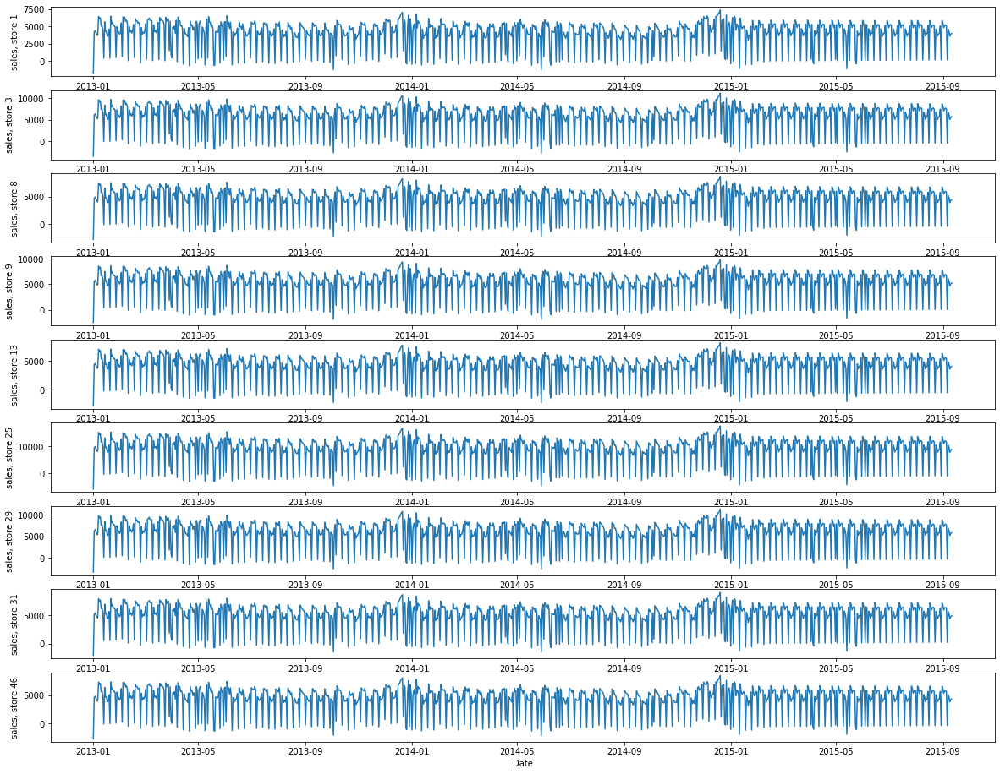

In [132]:
## Important stores are 1,3,8,9,13,25,29,31 and 46

fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9) = plt.subplots(9, 1,figsize=(20,16))
##fig.suptitle('A tale of 2 subplots')

ax1.plot( y_hat1['sarimax_forecast_original'])
ax1.set_ylabel('sales, store 1')

ax2.plot( y_hat3['sarimax_forecast_original'])
ax2.set_ylabel('sales, store 3')

ax3.plot( y_hat8['sarimax_forecast_original'])
ax3.set_ylabel('sales, store 8')

ax4.plot( y_hat9['sarimax_forecast_original'])
ax4.set_ylabel('sales, store 9')

ax5.plot( y_hat13['sarimax_forecast_original'])
ax5.set_ylabel('sales, store 13')

ax6.plot( y_hat25['sarimax_forecast_original'])
ax6.set_ylabel('sales, store 25')

ax7.plot(y_hat29['sarimax_forecast_original'])
ax7.set_ylabel('sales, store 29')

ax8.plot(y_hat31['sarimax_forecast_original'])
ax8.set_ylabel('sales, store 31')

ax9.plot(y_hat46['sarimax_forecast_original'])
ax9.set_xlabel('Date')
ax9.set_ylabel('sales, store 46')

plt.show()

## Result Summary
- ****Best model based on RMSE and MAPE is SARIMAX****
- **Prediction for the next 6 weeks is as shown above**